In [1]:
## Import the necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#display all codes in a coding block
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

##Display all dataframe column names and results.
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)

In [2]:
## Read in the Dataset and have an overall glimpse at the data
## Reading both the facebook and instagram data
df_ins = pd.read_csv("./2022-07-25-21-04-14-EDT-search-csv-export.csv")
df_face = pd.read_csv("./2022-09-24_Facebook.csv")
df_ins.info()
df_face.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10167 entries, 0 to 10166
Data columns (total 22 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Account                                                  10154 non-null  object 
 1   User Name                                                10167 non-null  object 
 2   Followers at Posting                                     4129 non-null   float64
 3   Post Created                                             10167 non-null  object 
 4   Post Created Date                                        10167 non-null  object 
 5   Post Created Time                                        10167 non-null  object 
 6   Type                                                     10167 non-null  object 
 7   Total Interactions                                       10167 non-null  object 
 8   Likes                     

As we can see from the above, there are few columns within the dataset that we can get rid of. They are either duplicated from another column or they are a completely empty column.

In [3]:
## Dropping unuseful columns and creating a new column ID that can be used later on to index
df1_ins = df_ins.drop(columns =['Title', 'Link','Total Interactions (weighted  —  Likes 1x Comments 1x )'])
df1_ins['id'] = df1_ins.index
first_column = df1_ins.pop('id')
df1_ins.insert(0,'id', first_column)
df1_ins.info()
df1_ins.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10167 entries, 0 to 10166
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             10167 non-null  int64  
 1   Account                        10154 non-null  object 
 2   User Name                      10167 non-null  object 
 3   Followers at Posting           4129 non-null   float64
 4   Post Created                   10167 non-null  object 
 5   Post Created Date              10167 non-null  object 
 6   Post Created Time              10167 non-null  object 
 7   Type                           10167 non-null  object 
 8   Total Interactions             10167 non-null  object 
 9   Likes                          10167 non-null  int64  
 10  Comments                       10167 non-null  int64  
 11  Views                          10167 non-null  int64  
 12  Like and View Counts Disabled  10167 non-null 

,id,Account,User Name,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Views,Like and View Counts Disabled,URL,Photo,Description,Image Text,Sponsor Id,Sponsor Name,Overperforming Score
0,0,Genelia Deshmukh,geneliad,7291844.0,2021-10-16 05:22:21 EDT,2021-10-16,05:22:21,Album,49 779,49634,145,0,False,https://www.instagram.com/p/CVFZVlsogvO/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/246276386_246951120783485_3238136309611538599_n.jpg?_nc_cat=104&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=OnNeGx8TluQAX9UBzao&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9usnNIWXLUn-EHWuNd7z1LzLTyIMDnp3FRQv_TAmb1fg&oe=62E48BAF,"#worldfoodday2021 \n\n We need to make our food - our investment into our health, our being and all the other beings that exist and most importantly our planet 💚\n\nLet’s change our planet - One bite at a time..\n\nWww.imaginemeats.com\n\n•\n#ImagineMeats #ImagineChicken #ImagineMutton #Plantbased #Plantbasedmeat #Plantlover #Happymeat #Meatfree #Meatlesseveryday #alternativeprotein #Meatlessmeat #Crueltyfree #worldfoodday2021",NaN,NaN,NaN,-6.16
1,1,The N kitchen,blend.of.spices,NaN,2022-01-05 11:13:43 EST,2022-01-05,11:13:43,Album,46 189,46025,164,0,False,https://www.instagram.com/p/CYWszc_PzsB/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/271304997_228085712837104_2842214994172471325_n.jpg?_nc_cat=106&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=qrjgj-0YJ64AX81LGaA&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9ZaF0DwmVaaKX54JYylFWwTebxIRkUR3PJ9z5Bnyx8uw&oe=62E44E12,Swipe left to Choose your favorite chole combo ➡️➡️ \n. \n1. Chole Bhature 🍱🍱\n. \n2. Chole Samosa🧆🧆\n. \n3. Chole Paratha🥙🥙\n. \n4. Chole Kulcha🥘🥘\n. \n5. Chole Chawal🍛🍛\n. \n6. Chole Kachori🍲🍲\n. \n7. Chole Naan🌮🌮\n. \n8. Chole Tikki🍝🍝\n. \n9. Chole Poori🍜🍜\n\nComment down your favourite combo and for more such updates follow @blend.of.spices @blend.of.spices \n@blend.of.spices @blend.of.spices \n\n#choleplatter #cholecombo #cholebhature #cholechawal #cholepoori #kulcha #tikki #samose #kachori #naan #paratha #delhigram #delhieats #delhifood #foodiesofinstagram #foodcontest #foodcompetition #comment #foodgasm #foodblogger #indianfoodblogger #noidaeats #calcuttafoodie #punjabifood #amritsari #foodunfolded,NaN,NaN,NaN,0
2,2,Moving Mountains Foods,movingmountainsfoods,24100.0,2021-01-08 05:00:06 EST,2021-01-08,05:00:06,Photo,31 126,30857,269,0,False,https://www.instagram.com/p/CJx6SQis_Qh/,NaN,"📣 ANNOUNCEMENT📣\n \nWe have just launched the meatiest plant-based product in the world! Introducing our brand new plant-based Beef Tender Strips 🎉 Now available from @Sainsburys - find them in the frozen aisle!\n \nTo learn more about our #OutrageouslyMeaty product, tap the link in our bio.\n.\n.\n.\n#MovingMountains #meatmadefromplants #plantbasedbeef #vegancommunity #whatveganseat #vegannews #sustainablefood #veganchef #plantbased #futurefood #plantpower #healthyeating #plantbasedfood #veganbeef #veganmeat",NaN,NaN,NaN,80.22
3,3,www.melissas.com,melissasproduce,74828.0,2021-04-09 21:35:07 EDT,2021-04-09,21:35:07,Photo,20 938,20855,83,0,False,https://www.instagram.com/p/CNd5nvNDUN4/,https://scontent-sea1-1.cdninstagram.com/v/t51.2885-15/170374983_913633265878490_2541226670276993394_n.jpg?_nc_cat=100&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=LHf1_n4afjUAX8MBg35&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT_M0sFOGda7oRnBVI4cqnXPT3ASoTUVj3A1gqbm4HApUw&oe=62E5276B,We really love this easy guide by @nutritional_factz with plant based protein alternatives if you're limiting or not eating animal protein. Which one are you most surprised by? 🤓 \n•\n•\n•\n•\n•\n•\n#melissasproduce #melissas #produce #losangeles #melissasproducecompany #plantbased #plantprotein #protein #healthyeating #healthyrecipes #meatless #meatlessmonday #meatlessprotein #mealprep #mealprepping #health #healthy #healthylifestyle #vegan #vegetarian #vegandiet,NaN,NaN,NaN,96.94
4,4,WTF FUN FACTS,wtffunfacts,728897.0,2020-09-23 10:32:09 EDT,2020-09-23,10:32:

In [4]:
## Dropping unuseful columns and creating a new column ID that can be used later on to index
df1_face = df_face.drop(columns =['Total Interactions (weighted  —  Likes 1x Shares 1x Comments 1x Love 1x Wow 1x Haha 1x Sad 1x Angry 1x Care 1x )'])
df1_face['id'] = df1_face.index
first_column = df1_face.pop('id')
df1_face.insert(0,'id', first_column)
df1_face.info()
df1_face.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8627 entries, 0 to 8626
Data columns (total 41 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              8627 non-null   int64  
 1   Page Name                       8627 non-null   object 
 2   User Name                       7798 non-null   object 
 3   Facebook Id                     8627 non-null   int64  
 4   Page Category                   8615 non-null   object 
 5   Page Admin Top Country          5711 non-null   object 
 6   Page Description                7839 non-null   object 
 7   Page Created                    7839 non-null   object 
 8   Likes at Posting                4579 non-null   float64
 9   Followers at Posting            3468 non-null   float64
 10  Post Created                    8627 non-null   object 
 11  Post Created Date               8627 non-null   object 
 12  Post Created Time               86

,id,Page Name,User Name,Facebook Id,Page Category,Page Admin Top Country,Page Description,Page Created,Likes at Posting,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Shares,Love,Wow,Haha,Sad,Angry,Care,Video Share Status,Is Video Owner?,Post Views,Total Views,Total Views For All Crossposts,Video Length,URL,Message,Link,Final Link,Image Text,Link Text,Description,Sponsor Id,Sponsor Name,Sponsor Category,Overperforming Score
0,0,End Time Headlines,endtimeheadline,100044353509856,PERSONAL_BLOG,US,News and Headlines from a “Prophetic Perspective”,2010-07-01 15:23:48,559945.0,548028.0,2020-05-10 17:52:18 PDT,2020-05-10,17:52:18,Link,11 645,290,654,8455,4,416,9,140,1676,1,NaN,-,0,0,0,NaN,https://www.facebook.com/135010313189665/posts/3334488166575181,Tyson Foods is boosting its bet on meat that comes from the lab instead of the slaughterhouse and is partnering with Bill Gates and Richard Branson among other high profile backers! #labgrownmeat #foodshortage #billgates #tysonfoods,https://endtimeheadlines.org/2020/05/tyson-foods-joins-bill-gates-and-cargill-to-invest-in-lab-meat-producer/,https://endtimeheadlines.org/,NaN,"Tyson Foods Joins Bill Gates and Cargill to Invest in ""Lab-Meat Producer""","(ETH) - With all the talk about coming food shortages in America and around the world, It appears that there is future investments being made in",NaN,NaN,NaN,23.62
1,1,Brinc,Brinc.io,824410874258605,INTERNET_COMPANY,HK,"Headquartered in Hong Kong, Brinc is a leader in global venture acceleration, operating 18 multidisciplinary accelerator programs in 7 countries. Brinc accelerates startups focused on sustainability.",2014-08-26 09:27:10,2720.0,2905.0,2019-04-27 18:28:59 PDT,2019-04-27,18:28:59,Photo,10 001,9986,0,1,12,1,1,0,0,0,NaN,-,0,0,0,NaN,https://www.facebook.com/824410874258605/posts/2476020049097671,"Recently in collaboration with The Good Food Institute, we are delighted to release the first international edition of The Good Food Startup Manual. The manual is a 100+ page step-by-step instruction book for entrepreneurs who want to set up their own plant-based or cell-based protein startups 🌱 Read more & download: https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e#GoodFoodInstitute:=:https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e #GFI #FoodTechnology #FoodTech #Startup #CleanMeat #CulturedMeat #PlantBased #FutureFood #FoodLab #SustainableFood #Sustainability #MeatAlternatives #Vegan",https://www.facebook.com/Brinc.io/photos/a.944565612243130/2476018862431123/?type=3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,526.37
2,2,Legend Killer Charters,legendkillercharters,831781093546602,TOPIC_SPORTS_RECREATION,US,Saginaw Bay Walleye\nDetroit River Walleye\nSaginaw River Walleye\nLake Michigan King Salmon\nOffering fun filled fishing trips for the whole family. We pride ourselves for being a fun and educational fishing charter. Trips for all anglers!\n,2015-01-08 00:51:45,NaN,NaN,2019-04-08 18:01:02 PDT,2019-04-08,18:01:02,Native Video,5 869,819,411,4566,34,32,2,1,3,1,owned,Yes,33772,432773,0,00:01:10,https://www.facebook.com/831781093546602/posts/2294269170631113,"Filleting a walleye plus , cheeks and walleye wings! #walleye #saginawbay #walleyecharter #detroitriver #jigemup #motorcity #cleanmeat",https://www.facebook.com/legendkillercharters/videos/285843252312741/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.43
3,3,Food Standards Agency,FoodStandardsAgency,100064659582632,GOVERNMENT_ORGANIZATION,GB,We're the Food Standards Agency. It’s our job to use our expertise and influence so that people ca,2012-10-11 14:49:48,44118.0,50267.0,2022-07-13 04:20:03 PDT,2022-07-13,04:20:03,Photo,5 223,72,1217,3144,5,42,193,16,534,0,NaN,-,0,0,0,NaN,https://www.facebook.com/100064659582632/posts/406233634875286,"Today we have launched a consultation on plans to bring clarity to the law on selling insects for human consumption. Our proposals wil

Account column represents the name for the account and Username is the ID asssociated with the account, in our dataset, there are a few account name missing and this wouldn't affect our analysis.

Followers at Posting lacks more than half of the datapoints.

There are 10167 records of posts since each User Name is associated with one individual post, therefore by counting the User Name we can get a result of how many posts there are.

As for the number of users, since User Name is a unique ID for each user, we can just see how many distinct User Name there are. Here's the result:

In [5]:
##Calculating Number of Users for instagram data
num = df1_ins['User Name'].value_counts()
print("No. of Users:" + str(len(num)))

No. of Users:2237


There are 2237 unique users.

In [6]:
## Distribution of the hashtags (barplot or similar)
## In order to achieve such things we must seperate the hashtags out from the Description column

## Creating a function in order to pickout the hashtag words.
def extract_hashtags(text):
    list1 = []

    for word in text.split():
        if word[0] == '#':  
            list1.append(word[1:])
    
    remove_duplicate_list = list(set(list1))
    
    return remove_duplicate_list

## Inputing the list from the Description column, creating a function that will have a nested list
def hashtags_list(list_input):
    hashtag_list = []
    for i in list_input:
        z = extract_hashtags(str(i))
        hashtag_list.append(z) 
    
    return hashtag_list

s = df1_ins['Description'].tolist()
s_face = df1_face['Message'].tolist()
#loading in the Description column
h_list = hashtags_list(s)
#lower case everything to make content case insensitive
h_list = [[string.lower() for string in sublist] for sublist in h_list]

#loading in the Description column
h_list_face = hashtags_list(s_face)
#lower case everything to make content case insensitive
h_list_face = [[string.lower() for string in sublist] for sublist in h_list_face]


## Function to create a list that only contains hashtag words from the given template
def keep_key_hashtag(list1):
    f_list = []
    keyword_list = ['edibleinsects', 'alternativeprotein', 'futurefood', 'futurefoods', 'ediblebugs','meatlessprotein', 'cultivatedmeat', 'culturedmeat', 'labgrownmeat', 'foodunfolded', 'cleanmeat']
    for sublist in list1:
        sub_filtered_list = []
        for item in sublist:
            if item in keyword_list:
                sub_filtered_list.append(item)
        f_list.append(sub_filtered_list)
    
    return f_list


In [7]:
## Creating a dataframe that includes all hashtags in the Hashtag column for instagram data
all_hashtag_df_ins = pd.DataFrame(np.array(h_list, dtype=object), columns = ['Hashtag'])
all_hashtag_df_ins['id'] = all_hashtag_df_ins.index
first_column = all_hashtag_df_ins.pop('id')
all_hashtag_df_ins.insert(0,'id', first_column)

df_ins_merged = pd.merge(df1_ins, all_hashtag_df_ins, how = "left", on ='id')
df_ins_merged['HASHTAG'] = df_ins_merged.Hashtag.apply(', '.join)
df_ins_merged.drop('Hashtag',axis=1, inplace=True)
df_ins_merged.head()


,id,Account,User Name,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Views,Like and View Counts Disabled,URL,Photo,Description,Image Text,Sponsor Id,Sponsor Name,Overperforming Score,HASHTAG
0,0,Genelia Deshmukh,geneliad,7291844.0,2021-10-16 05:22:21 EDT,2021-10-16,05:22:21,Album,49 779,49634,145,0,False,https://www.instagram.com/p/CVFZVlsogvO/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/246276386_246951120783485_3238136309611538599_n.jpg?_nc_cat=104&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=OnNeGx8TluQAX9UBzao&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9usnNIWXLUn-EHWuNd7z1LzLTyIMDnp3FRQv_TAmb1fg&oe=62E48BAF,"#worldfoodday2021 \n\n We need to make our food - our investment into our health, our being and all the other beings that exist and most importantly our planet 💚\n\nLet’s change our planet - One bite at a time..\n\nWww.imaginemeats.com\n\n•\n#ImagineMeats #ImagineChicken #ImagineMutton #Plantbased #Plantbasedmeat #Plantlover #Happymeat #Meatfree #Meatlesseveryday #alternativeprotein #Meatlessmeat #Crueltyfree #worldfoodday2021",NaN,NaN,NaN,-6.16,"worldfoodday2021, meatlesseveryday, plantlover, meatlessmeat, meatfree, imaginemutton, imaginechicken, alternativeprotein, plantbased, imaginemeats, crueltyfree, happymeat, plantbasedmeat"
1,1,The N kitchen,blend.of.spices,NaN,2022-01-05 11:13:43 EST,2022-01-05,11:13:43,Album,46 189,46025,164,0,False,https://www.instagram.com/p/CYWszc_PzsB/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/271304997_228085712837104_2842214994172471325_n.jpg?_nc_cat=106&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=qrjgj-0YJ64AX81LGaA&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9ZaF0DwmVaaKX54JYylFWwTebxIRkUR3PJ9z5Bnyx8uw&oe=62E44E12,Swipe left to Choose your favorite chole combo ➡️➡️ \n. \n1. Chole Bhature 🍱🍱\n. \n2. Chole Samosa🧆🧆\n. \n3. Chole Paratha🥙🥙\n. \n4. Chole Kulcha🥘🥘\n. \n5. Chole Chawal🍛🍛\n. \n6. Chole Kachori🍲🍲\n. \n7. Chole Naan🌮🌮\n. \n8. Chole Tikki🍝🍝\n. \n9. Chole Poori🍜🍜\n\nComment down your favourite combo and for more such updates follow @blend.of.spices @blend.of.spices \n@blend.of.spices @blend.of.spices \n\n#choleplatter #cholecombo #cholebhature #cholechawal #cholepoori #kulcha #tikki #samose #kachori #naan #paratha #delhigram #delhieats #delhifood #foodiesofinstagram #foodcontest #foodcompetition #comment #foodgasm #foodblogger #indianfoodblogger #noidaeats #calcuttafoodie #punjabifood #amritsari #foodunfolded,NaN,NaN,NaN,0,"indianfoodblogger, amritsari, cholecombo, comment, cholepoori, calcuttafoodie, foodcontest, delhifood, cholechawal, foodiesofinstagram, tikki, foodcompetition, kulcha, naan, delhigram, samose, delhieats, punjabifood, foodunfolded, foodgasm, foodblogger, noidaeats, choleplatter, cholebhature, paratha, kachori"
2,2,Moving Mountains Foods,movingmountainsfoods,24100.0,2021-01-08 05:00:06 EST,2021-01-08,05:00:06,Photo,31 126,30857,269,0,False,https://www.instagram.com/p/CJx6SQis_Qh/,NaN,"📣 ANNOUNCEMENT📣\n \nWe have just launched the meatiest plant-based product in the world! Introducing our brand new plant-based Beef Tender Strips 🎉 Now available from @Sainsburys - find them in the frozen aisle!\n \nTo learn more about our #OutrageouslyMeaty product, tap the link in our bio.\n.\n.\n.\n#MovingMountains #meatmadefromplants #plantbasedbeef #vegancommunity #whatveganseat #vegannews #sustainablefood #veganchef #plantbased #futurefood #plantpower #healthyeating #plantbasedfood #veganbeef #veganmeat",NaN,NaN,NaN,80.22,"plantbasedfood, sustainablefood, plantbased, movingmountains, futurefood, veganchef, veganbeef, healthyeating, plantpower, veganmeat, whatveganseat, vegannews, outrageouslymeaty, meatmadefromplants, plantbasedbeef, vegancommunity"
3,3,www.melissas.com,melissasproduce,74828.0,2021-04-09 21:35:07 EDT,2021-04-09,21:35:07,Photo,20 938,20855,83,0,False,https://www.instagram.com/p/CNd5nvNDUN4/,https://scontent-sea1-1.cdninstagram.com/v/t51.2885-15/170374983_913633265878490_2541226670276993394

In [8]:
## Creating a dataframe that includes all hashtags in the Hashtag column for facebook data
all_hashtag_df_face = pd.DataFrame(np.array(h_list_face, dtype=object), columns = ['Hashtag'])
all_hashtag_df_face['id'] = all_hashtag_df_face.index
first_column = all_hashtag_df_face.pop('id')
all_hashtag_df_face.insert(0,'id', first_column)

df_face_merged = pd.merge(df1_face, all_hashtag_df_face, how = "left", on ='id')
df_face_merged['HASHTAG'] = df_face_merged.Hashtag.apply(', '.join)
df_face_merged.drop('Hashtag',axis=1, inplace=True)
df_face_merged.head()

,id,Page Name,User Name,Facebook Id,Page Category,Page Admin Top Country,Page Description,Page Created,Likes at Posting,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Shares,Love,Wow,Haha,Sad,Angry,Care,Video Share Status,Is Video Owner?,Post Views,Total Views,Total Views For All Crossposts,Video Length,URL,Message,Link,Final Link,Image Text,Link Text,Description,Sponsor Id,Sponsor Name,Sponsor Category,Overperforming Score,HASHTAG
0,0,End Time Headlines,endtimeheadline,100044353509856,PERSONAL_BLOG,US,News and Headlines from a “Prophetic Perspective”,2010-07-01 15:23:48,559945.0,548028.0,2020-05-10 17:52:18 PDT,2020-05-10,17:52:18,Link,11 645,290,654,8455,4,416,9,140,1676,1,NaN,-,0,0,0,NaN,https://www.facebook.com/135010313189665/posts/3334488166575181,Tyson Foods is boosting its bet on meat that comes from the lab instead of the slaughterhouse and is partnering with Bill Gates and Richard Branson among other high profile backers! #labgrownmeat #foodshortage #billgates #tysonfoods,https://endtimeheadlines.org/2020/05/tyson-foods-joins-bill-gates-and-cargill-to-invest-in-lab-meat-producer/,https://endtimeheadlines.org/,NaN,"Tyson Foods Joins Bill Gates and Cargill to Invest in ""Lab-Meat Producer""","(ETH) - With all the talk about coming food shortages in America and around the world, It appears that there is future investments being made in",NaN,NaN,NaN,23.62,"labgrownmeat, billgates, tysonfoods, foodshortage"
1,1,Brinc,Brinc.io,824410874258605,INTERNET_COMPANY,HK,"Headquartered in Hong Kong, Brinc is a leader in global venture acceleration, operating 18 multidisciplinary accelerator programs in 7 countries. Brinc accelerates startups focused on sustainability.",2014-08-26 09:27:10,2720.0,2905.0,2019-04-27 18:28:59 PDT,2019-04-27,18:28:59,Photo,10 001,9986,0,1,12,1,1,0,0,0,NaN,-,0,0,0,NaN,https://www.facebook.com/824410874258605/posts/2476020049097671,"Recently in collaboration with The Good Food Institute, we are delighted to release the first international edition of The Good Food Startup Manual. The manual is a 100+ page step-by-step instruction book for entrepreneurs who want to set up their own plant-based or cell-based protein startups 🌱 Read more & download: https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e#GoodFoodInstitute:=:https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e #GFI #FoodTechnology #FoodTech #Startup #CleanMeat #CulturedMeat #PlantBased #FutureFood #FoodLab #SustainableFood #Sustainability #MeatAlternatives #Vegan",https://www.facebook.com/Brinc.io/photos/a.944565612243130/2476018862431123/?type=3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,526.37,"plantbased, futurefood, gfi, vegan, foodtechnology, foodtech, foodlab, meatalternatives, sustainablefood, culturedmeat, startup, cleanmeat, sustainability"
2,2,Legend Killer Charters,legendkillercharters,831781093546602,TOPIC_SPORTS_RECREATION,US,Saginaw Bay Walleye\nDetroit River Walleye\nSaginaw River Walleye\nLake Michigan King Salmon\nOffering fun filled fishing trips for the whole family. We pride ourselves for being a fun and educational fishing charter. Trips for all anglers!\n,2015-01-08 00:51:45,NaN,NaN,2019-04-08 18:01:02 PDT,2019-04-08,18:01:02,Native Video,5 869,819,411,4566,34,32,2,1,3,1,owned,Yes,33772,432773,0,00:01:10,https://www.facebook.com/831781093546602/posts/2294269170631113,"Filleting a walleye plus , cheeks and walleye wings! #walleye #saginawbay #walleyecharter #detroitriver #jigemup #motorcity #cleanmeat",https://www.facebook.com/legendkillercharters/videos/285843252312741/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.43,"detroitriver, jigemup, cleanmeat, saginawbay, motorcity, walleye, walleyecharter"
3,3,Food Standards Agency,FoodStandardsAgency,100064659582632,GOVERNMENT_ORGANIZATION,GB,We're the Food Standards Agency. It’s our job to use our expertise and influence so that people ca,2012-10-11 14:49:48,44118.0,50267.0,2

In [9]:
## Creating a list that only includes the hashtag words from the given template

f_list = keep_key_hashtag(h_list)
hashtag_df_ins = pd.DataFrame(np.array(f_list, dtype=object), columns =['Hashtag'])
hashtag_df_ins['id'] = hashtag_df_ins.index
first_column = hashtag_df_ins.pop('id')
hashtag_df_ins.insert(0,'id', first_column)

df3_ins = pd.merge(df1_ins,hashtag_df_ins,how = "left", on='id')

##df3_ins['Hashtag'].str.replace('\[|\]|', '')
df3_ins['HASHTAG'] = df3_ins.Hashtag.apply(', '.join)
df3_ins.drop('Hashtag',axis=1, inplace=True)
df3_ins.head()
        

,id,Account,User Name,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Views,Like and View Counts Disabled,URL,Photo,Description,Image Text,Sponsor Id,Sponsor Name,Overperforming Score,HASHTAG
0,0,Genelia Deshmukh,geneliad,7291844.0,2021-10-16 05:22:21 EDT,2021-10-16,05:22:21,Album,49 779,49634,145,0,False,https://www.instagram.com/p/CVFZVlsogvO/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/246276386_246951120783485_3238136309611538599_n.jpg?_nc_cat=104&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=OnNeGx8TluQAX9UBzao&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9usnNIWXLUn-EHWuNd7z1LzLTyIMDnp3FRQv_TAmb1fg&oe=62E48BAF,"#worldfoodday2021 \n\n We need to make our food - our investment into our health, our being and all the other beings that exist and most importantly our planet 💚\n\nLet’s change our planet - One bite at a time..\n\nWww.imaginemeats.com\n\n•\n#ImagineMeats #ImagineChicken #ImagineMutton #Plantbased #Plantbasedmeat #Plantlover #Happymeat #Meatfree #Meatlesseveryday #alternativeprotein #Meatlessmeat #Crueltyfree #worldfoodday2021",NaN,NaN,NaN,-6.16,alternativeprotein
1,1,The N kitchen,blend.of.spices,NaN,2022-01-05 11:13:43 EST,2022-01-05,11:13:43,Album,46 189,46025,164,0,False,https://www.instagram.com/p/CYWszc_PzsB/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/271304997_228085712837104_2842214994172471325_n.jpg?_nc_cat=106&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=qrjgj-0YJ64AX81LGaA&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9ZaF0DwmVaaKX54JYylFWwTebxIRkUR3PJ9z5Bnyx8uw&oe=62E44E12,Swipe left to Choose your favorite chole combo ➡️➡️ \n. \n1. Chole Bhature 🍱🍱\n. \n2. Chole Samosa🧆🧆\n. \n3. Chole Paratha🥙🥙\n. \n4. Chole Kulcha🥘🥘\n. \n5. Chole Chawal🍛🍛\n. \n6. Chole Kachori🍲🍲\n. \n7. Chole Naan🌮🌮\n. \n8. Chole Tikki🍝🍝\n. \n9. Chole Poori🍜🍜\n\nComment down your favourite combo and for more such updates follow @blend.of.spices @blend.of.spices \n@blend.of.spices @blend.of.spices \n\n#choleplatter #cholecombo #cholebhature #cholechawal #cholepoori #kulcha #tikki #samose #kachori #naan #paratha #delhigram #delhieats #delhifood #foodiesofinstagram #foodcontest #foodcompetition #comment #foodgasm #foodblogger #indianfoodblogger #noidaeats #calcuttafoodie #punjabifood #amritsari #foodunfolded,NaN,NaN,NaN,0,foodunfolded
2,2,Moving Mountains Foods,movingmountainsfoods,24100.0,2021-01-08 05:00:06 EST,2021-01-08,05:00:06,Photo,31 126,30857,269,0,False,https://www.instagram.com/p/CJx6SQis_Qh/,NaN,"📣 ANNOUNCEMENT📣\n \nWe have just launched the meatiest plant-based product in the world! Introducing our brand new plant-based Beef Tender Strips 🎉 Now available from @Sainsburys - find them in the frozen aisle!\n \nTo learn more about our #OutrageouslyMeaty product, tap the link in our bio.\n.\n.\n.\n#MovingMountains #meatmadefromplants #plantbasedbeef #vegancommunity #whatveganseat #vegannews #sustainablefood #veganchef #plantbased #futurefood #plantpower #healthyeating #plantbasedfood #veganbeef #veganmeat",NaN,NaN,NaN,80.22,futurefood
3,3,www.melissas.com,melissasproduce,74828.0,2021-04-09 21:35:07 EDT,2021-04-09,21:35:07,Photo,20 938,20855,83,0,False,https://www.instagram.com/p/CNd5nvNDUN4/,https://scontent-sea1-1.cdninstagram.com/v/t51.2885-15/170374983_913633265878490_2541226670276993394_n.jpg?_nc_cat=100&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=LHf1_n4afjUAX8MBg35&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT_M0sFOGda7oRnBVI4cqnXPT3ASoTUVj3A1gqbm4HApUw&oe=62E5276B,We really love this easy guide by @nutritional_factz with plant based protein alternatives if you're limiting or not eating animal protein. Which one are you most surprised by? 🤓 \n•\n•\n•\n•\n•\n•\n#melissasproduce #melissas #produce #losangeles #melissasproducecompany #plantbased #plantprotein #protein #healthyeating #healthyrecipes #meatless #meatlessmonday #meatlessprotein #mealprep #mealprepping #health #healthy #healthylifestyle #vegan #vegetarian #vegandiet,NaN,NaN,NaN,96.94,meatlessprotein
4,4,WTF FUN F

In [10]:
## Creating a list that only includes the hashtag words from the given template for facebook data

f_list_face = keep_key_hashtag(h_list_face)
hashtag_df_face = pd.DataFrame(np.array(f_list_face, dtype=object), columns =['Hashtag'])
hashtag_df_face['id'] = hashtag_df_face.index
first_column = hashtag_df_face.pop('id')
hashtag_df_face.insert(0,'id', first_column)

df3_face = pd.merge(df1_face,hashtag_df_face,how = "left", on='id')

##df3_face['Hashtag'].str.replace('\[|\]|', '')
df3_face['HASHTAG'] = df3_face.Hashtag.apply(', '.join)
df3_face.drop('Hashtag',axis=1, inplace=True)
df3_face.head()

,id,Page Name,User Name,Facebook Id,Page Category,Page Admin Top Country,Page Description,Page Created,Likes at Posting,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Shares,Love,Wow,Haha,Sad,Angry,Care,Video Share Status,Is Video Owner?,Post Views,Total Views,Total Views For All Crossposts,Video Length,URL,Message,Link,Final Link,Image Text,Link Text,Description,Sponsor Id,Sponsor Name,Sponsor Category,Overperforming Score,HASHTAG
0,0,End Time Headlines,endtimeheadline,100044353509856,PERSONAL_BLOG,US,News and Headlines from a “Prophetic Perspective”,2010-07-01 15:23:48,559945.0,548028.0,2020-05-10 17:52:18 PDT,2020-05-10,17:52:18,Link,11 645,290,654,8455,4,416,9,140,1676,1,NaN,-,0,0,0,NaN,https://www.facebook.com/135010313189665/posts/3334488166575181,Tyson Foods is boosting its bet on meat that comes from the lab instead of the slaughterhouse and is partnering with Bill Gates and Richard Branson among other high profile backers! #labgrownmeat #foodshortage #billgates #tysonfoods,https://endtimeheadlines.org/2020/05/tyson-foods-joins-bill-gates-and-cargill-to-invest-in-lab-meat-producer/,https://endtimeheadlines.org/,NaN,"Tyson Foods Joins Bill Gates and Cargill to Invest in ""Lab-Meat Producer""","(ETH) - With all the talk about coming food shortages in America and around the world, It appears that there is future investments being made in",NaN,NaN,NaN,23.62,labgrownmeat
1,1,Brinc,Brinc.io,824410874258605,INTERNET_COMPANY,HK,"Headquartered in Hong Kong, Brinc is a leader in global venture acceleration, operating 18 multidisciplinary accelerator programs in 7 countries. Brinc accelerates startups focused on sustainability.",2014-08-26 09:27:10,2720.0,2905.0,2019-04-27 18:28:59 PDT,2019-04-27,18:28:59,Photo,10 001,9986,0,1,12,1,1,0,0,0,NaN,-,0,0,0,NaN,https://www.facebook.com/824410874258605/posts/2476020049097671,"Recently in collaboration with The Good Food Institute, we are delighted to release the first international edition of The Good Food Startup Manual. The manual is a 100+ page step-by-step instruction book for entrepreneurs who want to set up their own plant-based or cell-based protein startups 🌱 Read more & download: https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e#GoodFoodInstitute:=:https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e #GFI #FoodTechnology #FoodTech #Startup #CleanMeat #CulturedMeat #PlantBased #FutureFood #FoodLab #SustainableFood #Sustainability #MeatAlternatives #Vegan",https://www.facebook.com/Brinc.io/photos/a.944565612243130/2476018862431123/?type=3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,526.37,"futurefood, culturedmeat, cleanmeat"
2,2,Legend Killer Charters,legendkillercharters,831781093546602,TOPIC_SPORTS_RECREATION,US,Saginaw Bay Walleye\nDetroit River Walleye\nSaginaw River Walleye\nLake Michigan King Salmon\nOffering fun filled fishing trips for the whole family. We pride ourselves for being a fun and educational fishing charter. Trips for all anglers!\n,2015-01-08 00:51:45,NaN,NaN,2019-04-08 18:01:02 PDT,2019-04-08,18:01:02,Native Video,5 869,819,411,4566,34,32,2,1,3,1,owned,Yes,33772,432773,0,00:01:10,https://www.facebook.com/831781093546602/posts/2294269170631113,"Filleting a walleye plus , cheeks and walleye wings! #walleye #saginawbay #walleyecharter #detroitriver #jigemup #motorcity #cleanmeat",https://www.facebook.com/legendkillercharters/videos/285843252312741/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.43,cleanmeat
3,3,Food Standards Agency,FoodStandardsAgency,100064659582632,GOVERNMENT_ORGANIZATION,GB,We're the Food Standards Agency. It’s our job to use our expertise and influence so that people ca,2012-10-11 14:49:48,44118.0,50267.0,2022-07-13 04:20:03 PDT,2022-07-13,04:20:03,Photo,5 223,72,1217,3144,5,42,193,16,534,0,NaN,-,0,0,0,NaN,https://www.facebook.com/100064659582632/posts/406233634875286,"Today we have launched a consultation on plans to bring clarity t

<AxesSubplot:xlabel='Hashtags', ylabel='Count'>

Text(0.5, 1.0, 'Count of Hashtags')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Count')

(array([   0., 1000., 2000., 3000., 4000., 5000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'alternativeprotein'),
  Text(4, 0, 'ediblebugs'),
  Text(5, 0, 'foodunfolded'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'labgrownmeat'),
  Text(8, 0, 'futurefoods'),
  Text(9, 0, 'cultivatedmeat'),
  Text(10, 0, 'meatlessprotein')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'alternativeprotein'),
  Text(4, 0, 'ediblebugs'),
  Text(5, 0, 'foodunfolded'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'labgrownmeat'),
  Text(8, 0, 'futurefoods'),
  Text(9, 0, 'cultivatedmeat'),
  Text(10, 0, 'meatlessprotein')])

Text(0.0, 4747.3, '4747')

Text(0.0, 4867.0, '46.7%')

Text(1.0, 2389.3, '2389')

Text(1.0, 2509.0, '23.5%')

Text(2.0, 1329.3, '1329')

Text(2.0, 1449.0, '13.1%')

Text(3.0, 669.3, '669')

Text(3.0, 789.0, '6.6%')

Text(4.0, 482.3, '482')

Text(4.0, 602.0, '4.7%')

Text(5.0, 372.3, '372')

Text(5.0, 492.0, '3.7%')

Text(6.0, 324.3, '324')

Text(6.0, 444.0, '3.2%')

Text(7.0, 271.3, '271')

Text(7.0, 391.0, '2.7%')

Text(8.0, 191.3, '191')

Text(8.0, 311.0, '1.9%')

Text(9.0, 108.3, '108')

Text(9.0, 228.0, '1.1%')

Text(10.0, 65.3, '65')

Text(10.0, 185.0, '0.6%')

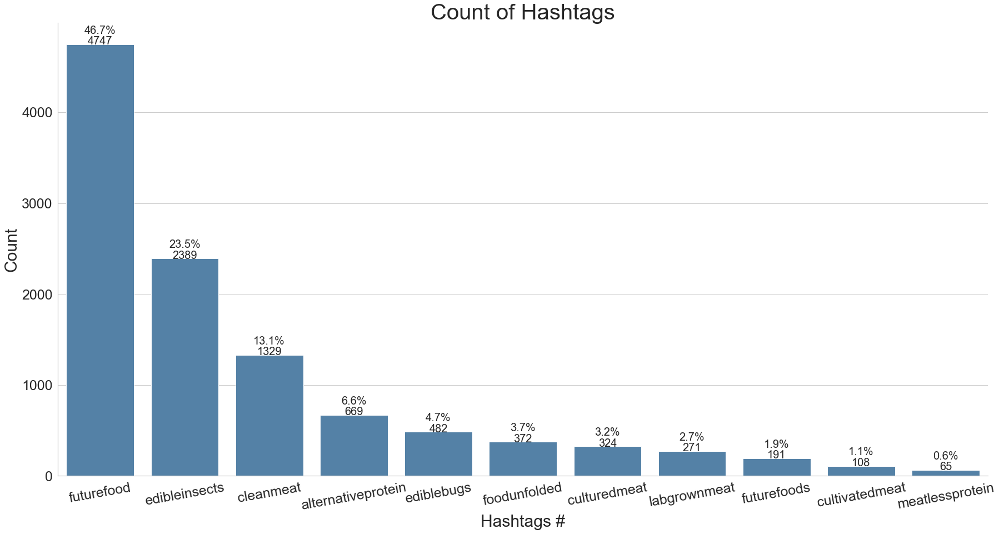

In [11]:
## Ploting the 10 specific Hashtag that was originally requested, showing the count of each Hashtag

## Manipulating the dataset to get the dataframe that we can use to plot
tag_pool = [i for tags in f_list for i in tags if i != '']
s = pd.value_counts(tag_pool)
s2 = pd.value_counts(tag_pool)/len(df3_ins)*100
s_df_ins = s.to_frame()
s_df_ins = s_df_ins.assign(Percentage = s2)
s_df_ins = s_df_ins.reset_index()
s_df_ins = s_df_ins.rename(columns= {'index':'Hashtags', 0:'Count'})

## Plotting using seaborn
sns.set_theme(style="whitegrid")
f, ax = plt.subplots(figsize=(30, 15))
sns.despine(f)
sns.barplot(x='Hashtags', y='Count', data=s_df_ins, color="steelblue")
plt.title('Count of Hashtags',fontsize= 40)
plt.xlabel('Hashtags #',fontsize=30)
plt.ylabel('Count',fontsize=30)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation = 10)

## Putting labels of count and percentage on top of each bar in the graph
patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.3
   z = patches[i].get_height()+120
   ax.annotate('{:}'.format(s_df_ins['Count'][i]), (x, y), ha='center',fontsize= 20)
   ax.annotate('{:.1f}%'.format(s_df_ins['Percentage'][i]), (x, z), ha='center',fontsize= 20)
plt.show()

<AxesSubplot:xlabel='Hashtags', ylabel='Count'>

Text(0.5, 1.0, 'Count of Hashtags')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Count')

(array([   0., 1000., 2000., 3000., 4000., 5000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'alternativeprotein'),
  Text(4, 0, 'ediblebugs'),
  Text(5, 0, 'foodunfolded'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'labgrownmeat'),
  Text(8, 0, 'futurefoods'),
  Text(9, 0, 'cultivatedmeat'),
  Text(10, 0, 'meatlessprotein')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'alternativeprotein'),
  Text(4, 0, 'ediblebugs'),
  Text(5, 0, 'foodunfolded'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'labgrownmeat'),
  Text(8, 0, 'futurefoods'),
  Text(9, 0, 'cultivatedmeat'),
  Text(10, 0, 'meatlessprotein')])

Text(-0.2, 4767.0, '4747')

Text(-0.2, 4927.0, '46.7%')

Text(0.8, 2409.0, '2389')

Text(0.8, 2569.0, '23.5%')

Text(1.8, 1349.0, '1329')

Text(1.8, 1509.0, '13.1%')

Text(2.8, 689.0, '669')

Text(2.8, 849.0, '6.6%')

Text(3.8, 502.0, '482')

Text(3.8, 662.0, '4.7%')

Text(4.8, 392.0, '372')

Text(4.8, 552.0, '3.7%')

Text(5.8, 344.0, '324')

Text(5.8, 504.0, '3.2%')

Text(6.8, 291.0, '271')

Text(6.8, 451.0, '2.7%')

Text(7.8, 211.0, '191')

Text(7.8, 371.0, '1.9%')

Text(8.8, 128.0, '108')

Text(8.8, 288.0, '1.1%')

Text(9.8, 85.0, '65')

Text(9.8, 245.0, '0.6%')

Text(0.2, 2347.0, '2339')

Text(0.2, 2507.0, '27.1%')

Text(1.2, 2359.0, '2327')

Text(1.2, 2519.0, '27.0%')

Text(2.2, 1479.0, '1459')

Text(2.2, 1639.0, '16.9%')

Text(3.2, 932.0, '912')

Text(3.2, 1092.0, '10.6%')

Text(4.2, 144.0, '784')

Text(4.2, 304.0, '9.1%')

Text(5.2, 393.0, '506')

Text(5.2, 553.0, '5.9%')

Text(6.2, 804.0, '373')

Text(6.2, 964.0, '4.3%')

Text(7.2, 225.0, '205')

Text(7.2, 385.0, '2.4%')

Text(8.2, 209.0, '189')

Text(8.2, 369.0, '2.2%')

Text(9.2, 526.0, '124')

Text(9.2, 686.0, '1.4%')

Text(10.2, 60.0, '40')

Text(10.2, 220.0, '0.5%')

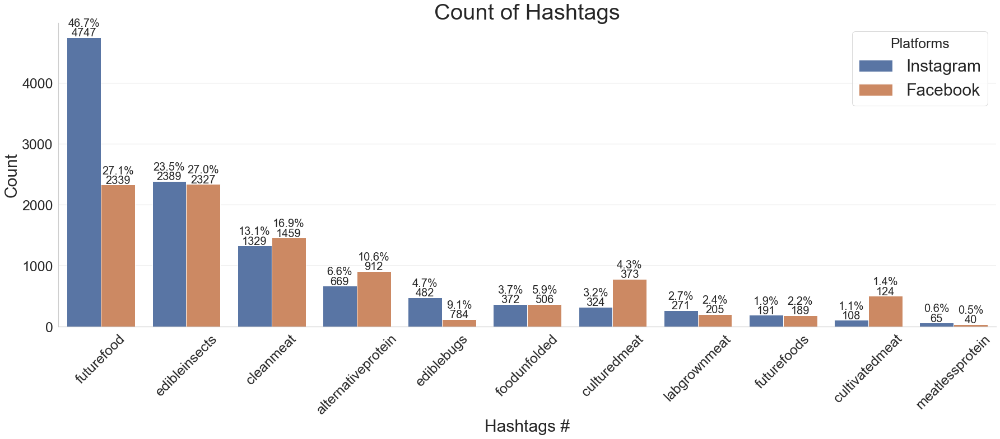

In [12]:
## Plotting the 10 specific Hashtag that was originally requested, showing the count of each Hashtag for both the instagram and facebook data
tag_pool_ins = [i for tags in f_list for i in tags if i != '']
tag_pool_face = [i for tags in f_list_face for i in tags if i != '']

temp_var_ins = pd.value_counts(tag_pool)
temp_var_face = pd.value_counts(tag_pool_face)
temp_var__ins_2 = pd.value_counts(tag_pool)/len(df3_ins)*100
temp_var__face_2 = pd.value_counts(tag_pool_face)/len(df3_face)*100
s_df_ins = temp_var_ins.to_frame()
s_df_face = temp_var_face.to_frame()

s_df_ins = s_df_ins.assign(Percentage = temp_var__ins_2)
s_df_face = s_df_face.assign(Percentage = temp_var__face_2)
s_df_ins = s_df_ins.reset_index()
s_df_face = s_df_face.reset_index()
s_df_ins = s_df_ins.rename(columns= {'index':'Hashtags', 0:'Count'})
s_df_face = s_df_face.rename(columns= {'index':'Hashtags', 0:'Count'})
s_df_ins['Platform'] = 'Instagram'
s_df_face['Platform'] = 'Facebook'
## merge s_df_ins and s_df_face
s_df_ins_face = pd.concat([s_df_ins, s_df_face], ignore_index=True)

## Plotting using seaborn
sns.set_theme(style="whitegrid")
f, ax = plt.subplots(figsize=(30, 10))
sns.despine(f)
sns.barplot(x='Hashtags', y='Count', hue='Platform', data=s_df_ins_face)
plt.title('Count of Hashtags',fontsize= 40)
plt.xlabel('Hashtags #',fontsize=30)
plt.ylabel('Count',fontsize=30)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation=45)
plt.legend(title = "Platforms",fontsize = 30, title_fontsize = 25)

p = ax.patches
for i in range(len(p)):
   x = p[i].get_x() + p[i].get_width()/2
   y = p[i].get_height()+20
   z = p[i].get_height()+ 180
   ax.annotate('{:}'.format(s_df_ins_face['Count'][i]), (x, y), ha='center',fontsize= 20)
   ax.annotate('{:.1f}%'.format(s_df_ins_face['Percentage'][i]), (x, z), ha='center',fontsize= 20)
plt.show()


['worldfoodday2021',
 'meatlesseveryday',
 'plantlover',
 'meatlessmeat',
 'meatfree',
 'imaginemutton',
 'imaginechicken',
 'alternativeprotein',
 'plantbased',
 'imaginemeats',
 'crueltyfree',
 'happymeat',
 'plantbasedmeat',
 'indianfoodblogger',
 'amritsari',
 'cholecombo',
 'comment',
 'cholepoori',
 'calcuttafoodie',
 'foodcontest',
 'delhifood',
 'cholechawal',
 'foodiesofinstagram',
 'tikki',
 'foodcompetition',
 'kulcha',
 'naan',
 'delhigram',
 'samose',
 'delhieats',
 'punjabifood',
 'foodunfolded',
 'foodgasm',
 'foodblogger',
 'noidaeats',
 'choleplatter',
 'cholebhature',
 'paratha',
 'kachori',
 'plantbasedfood',
 'sustainablefood',
 'plantbased',
 'movingmountains',
 'futurefood',
 'veganchef',
 'veganbeef',
 'healthyeating',
 'plantpower',
 'veganmeat',
 'whatveganseat',
 'vegannews',
 'outrageouslymeaty',
 'meatmadefromplants',
 'plantbasedbeef',
 'vegancommunity',
 'losangeles',
 'vegandiet',
 'produce',
 'health',
 'healthylifestyle',
 'melissasproducecompany',
 'pr

<AxesSubplot:xlabel='Hashtags', ylabel='Count'>

Text(0.5, 1.0, 'Count of Most Appeared Hashtags in the Instagram Dataset')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Count')

(array([   0., 1000., 2000., 3000., 4000., 5000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'sustainability'),
  Text(4, 0, 'food'),
  Text(5, 0, 'plantbased'),
  Text(6, 0, 'sustainable'),
  Text(7, 0, 'vegan'),
  Text(8, 0, 'sustainablefood'),
  Text(9, 0, 'protein'),
  Text(10, 0, 'sustainableliving'),
  Text(11, 0, 'foodie'),
  Text(12, 0, 'alternativeprotein'),
  Text(13, 0, 'healthyfood'),
  Text(14, 0, 'insectprotein'),
  Text(15, 0, 'entomophagy'),
  Text(16, 0, 'vegetarian'),
  Text(17, 0, 'eatinsects'),
  Text(18, 0, 'cleaneating'),
  Text(19, 0, 'insects')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'sustainability'),
  Text(4, 0, 'food'),
  Text(5, 0, 'plantbased'),
  Text(6, 0, 'sustainable'),
  Text(7, 0, 'vegan'),
  Text(8, 0, 'sustainablefood'),
  Text(9, 0, 'protein'),
  Text(10, 0, 'sustainableliving'),
  Text(11, 0, 'foodie'),
  Text(12, 0, 'alternativeprotein'),
  Text(13, 0, 'healthyfood'),
  Text(14, 0, 'insectprotein'),
  Text(15, 0, 'entomophagy'),
  Text(16, 0, 'vegetarian'),
  Text(17, 0, 'eatinsects'),
  Text(18, 0, 'cleaneating'),
  Text(19, 0, 'insects')])

Text(0.0, 4747.3, '4747')

Text(0.0, 4927.0, '46.7%')

Text(1.0, 2389.3, '2389')

Text(1.0, 2569.0, '23.5%')

Text(2.0, 1329.3, '1329')

Text(2.0, 1509.0, '13.1%')

Text(3.0, 1223.3, '1223')

Text(3.0, 1403.0, '12.0%')

Text(4.0, 1079.3, '1079')

Text(4.0, 1259.0, '10.6%')

Text(5.0, 989.3, '989')

Text(5.0, 1169.0, '9.7%')

Text(6.0, 973.3, '973')

Text(6.0, 1153.0, '9.6%')

Text(7.0, 807.3, '807')

Text(7.0, 987.0, '7.9%')

Text(8.0, 807.3, '807')

Text(8.0, 987.0, '7.9%')

Text(9.0, 734.3, '734')

Text(9.0, 914.0, '7.2%')

Text(10.0, 719.3, '719')

Text(10.0, 899.0, '7.1%')

Text(11.0, 710.3, '710')

Text(11.0, 890.0, '7.0%')

Text(12.0, 669.3, '669')

Text(12.0, 849.0, '6.6%')

Text(13.0, 659.3, '659')

Text(13.0, 839.0, '6.5%')

Text(14.0, 596.3, '596')

Text(14.0, 776.0, '5.9%')

Text(15.0, 569.3, '569')

Text(15.0, 749.0, '5.6%')

Text(16.0, 564.3, '564')

Text(16.0, 744.0, '5.5%')

Text(17.0, 563.3, '563')

Text(17.0, 743.0, '5.5%')

Text(18.0, 542.3, '542')

Text(18.0, 722.0, '5.3%')

Text(19.0, 512.3, '512')

Text(19.0, 692.0, '5.0%')

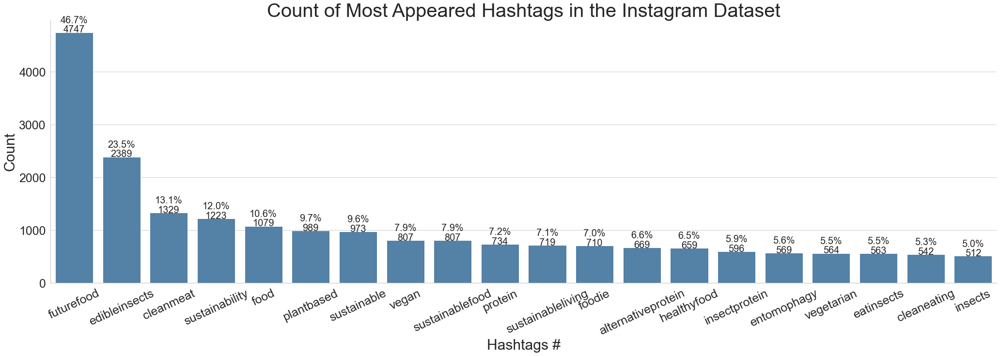

In [13]:
## Plotting the most appeared 20 Hashtags to see the count of each hashtags

## Manipulating the dataset to get the dataframe that we can use to plot
tag_pool_2 = [i for tags in h_list for i in tags if i != '']
tag_pool_2
s3 = pd.value_counts(tag_pool_2)
s4 = pd.value_counts(tag_pool_2)/len(df_ins_merged)*100
ss_df_ins = s3.to_frame()
ss_df_ins = ss_df_ins.assign(Percentage = s4)
ss_df_ins = ss_df_ins.reset_index()
ss_df_ins = ss_df_ins.rename(columns= {'index':'Hashtags', 0:'Count'})
ss_df_ins_20 = ss_df_ins.head(20)

## Plotting using seaborn
sns.set_theme(style="whitegrid")
f, ax = plt.subplots(figsize=(35, 10))
sns.despine(f)
sns.barplot(x= 'Hashtags', y='Count', data=ss_df_ins_20, color="steelblue")
plt.title('Count of Most Appeared Hashtags in the Instagram Dataset',fontsize= 40)
plt.xlabel('Hashtags #',fontsize=30)
plt.ylabel('Count',fontsize=30)
plt.yticks(fontsize= 25)
plt.xticks(fontsize=25)
plt.xticks(rotation=25)

## Putting labels of count and percentage on top of each bar in the graph
patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.3
   z = patches[i].get_height()+ 180
   ax.annotate('{:}'.format(ss_df_ins_20['Count'][i]), (x, y), ha='center',fontsize= 20)
   ax.annotate('{:.1f}%'.format(ss_df_ins_20['Percentage'][i]), (x, z), ha='center',fontsize= 20)
plt.show()

['labgrownmeat',
 'billgates',
 'tysonfoods',
 'foodshortage',
 'plantbased',
 'futurefood',
 'gfi',
 'vegan',
 'foodtechnology',
 'foodtech',
 'foodlab',
 'meatalternatives',
 'sustainablefood',
 'culturedmeat',
 'startup',
 'cleanmeat',
 'sustainability',
 'detroitriver',
 'jigemup',
 'cleanmeat',
 'saginawbay',
 'motorcity',
 'walleye',
 'walleyecharter',
 'altproteins',
 'edibleinsects',
 'perfectfood',
 '1minutemeals',
 'futurefood',
 'gmo',
 'fda',
 'labgrownmeat',
 'meat',
 'cargill',
 'fakemeat',
 'gmofreecanada',
 'tysonfoods',
 'billgates',
 'gmofreeusa',
 'gmo',
 'fda',
 'labgrownmeat',
 'meat',
 'cargill',
 'fakemeat',
 'gmofreecanada',
 'tysonfoods',
 'billgates',
 'gmofreeusa',
 'futurefoods',
 'bladerunner2049',
 'highproteinlowcarb',
 'entomophagy',
 'edibleinsects',
 'wildedible',
 'junebugs',
 'foragingtexas',
 'highprotein',
 'paleo',
 'paleodiet',
 'foraging',
 'forager',
 'desperatetimes',
 'labgrownmeat',
 'planet',
 'billgates',
 'startuppakistan',
 'marinades',


<AxesSubplot:xlabel='Hashtags', ylabel='Count'>

Text(0.5, 1.0, 'Count of Most Appeared Hashtags in the Facebook Dataset')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Count')

(array([   0.,  500., 1000., 1500., 2000., 2500.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'edibleinsects'),
  Text(1, 0, 'futurefood'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'sustainability'),
  Text(4, 0, 'alternativeprotein'),
  Text(5, 0, 'foodtech'),
  Text(6, 0, 'food'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'plantbased'),
  Text(9, 0, 'entomophagy'),
  Text(10, 0, 'protein'),
  Text(11, 0, 'startup'),
  Text(12, 0, 'cultivatedmeat'),
  Text(13, 0, 'meat'),
  Text(14, 0, 'sustainablefood'),
  Text(15, 0, 'healthy'),
  Text(16, 0, 'foodie'),
  Text(17, 0, 'superfood'),
  Text(18, 0, 'insectprotein'),
  Text(19, 0, 'innovation')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'edibleinsects'),
  Text(1, 0, 'futurefood'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'sustainability'),
  Text(4, 0, 'alternativeprotein'),
  Text(5, 0, 'foodtech'),
  Text(6, 0, 'food'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'plantbased'),
  Text(9, 0, 'entomophagy'),
  Text(10, 0, 'protein'),
  Text(11, 0, 'startup'),
  Text(12, 0, 'cultivatedmeat'),
  Text(13, 0, 'meat'),
  Text(14, 0, 'sustainablefood'),
  Text(15, 0, 'healthy'),
  Text(16, 0, 'foodie'),
  Text(17, 0, 'superfood'),
  Text(18, 0, 'insectprotein'),
  Text(19, 0, 'innovation')])

Text(0.0, 2339.3, '2339')

Text(0.0, 2429.0, '27.1%')

Text(1.0, 2327.3, '2327')

Text(1.0, 2417.0, '27.0%')

Text(2.0, 1459.3, '1459')

Text(2.0, 1549.0, '16.9%')

Text(3.0, 1005.3, '1005')

Text(3.0, 1095.0, '11.6%')

Text(4.0, 912.3, '912')

Text(4.0, 1002.0, '10.6%')

Text(5.0, 830.3, '830')

Text(5.0, 920.0, '9.6%')

Text(6.0, 789.3, '789')

Text(6.0, 879.0, '9.1%')

Text(7.0, 784.3, '784')

Text(7.0, 874.0, '9.1%')

Text(8.0, 689.3, '689')

Text(8.0, 779.0, '8.0%')

Text(9.0, 576.3, '576')

Text(9.0, 666.0, '6.7%')

Text(10.0, 572.3, '572')

Text(10.0, 662.0, '6.6%')

Text(11.0, 521.3, '521')

Text(11.0, 611.0, '6.0%')

Text(12.0, 506.3, '506')

Text(12.0, 596.0, '5.9%')

Text(13.0, 477.3, '477')

Text(13.0, 567.0, '5.5%')

Text(14.0, 466.3, '466')

Text(14.0, 556.0, '5.4%')

Text(15.0, 464.3, '464')

Text(15.0, 554.0, '5.4%')

Text(16.0, 449.3, '449')

Text(16.0, 539.0, '5.2%')

Text(17.0, 439.3, '439')

Text(17.0, 529.0, '5.1%')

Text(18.0, 411.3, '411')

Text(18.0, 501.0, '4.8%')

Text(19.0, 396.3, '396')

Text(19.0, 486.0, '4.6%')

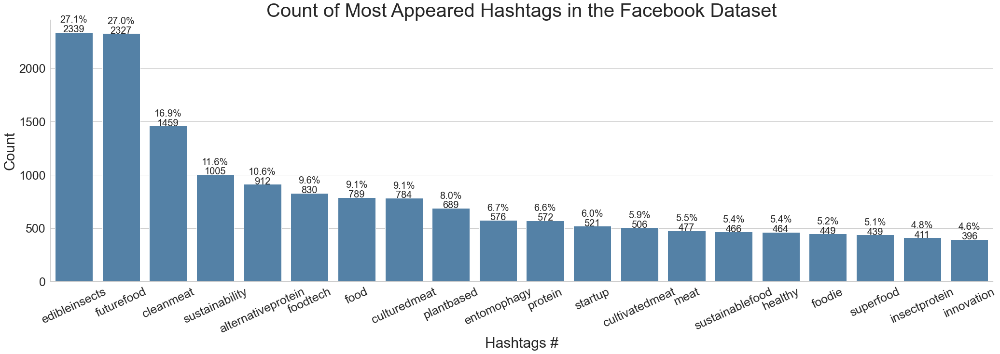

In [14]:
## Plotting the most appeared 20 Hashtags to see the count of each hashtags

## Manipulating the dataset to get the dataframe that we can use to plot
tag_pool_face_2 = [i for tags in h_list_face for i in tags if i != '']
tag_pool_face_2
s3_face = pd.value_counts(tag_pool_face_2)
s4_face = pd.value_counts(tag_pool_face_2)/len(df_face_merged)*100
ss_df_face = s3_face.to_frame()
ss_df_face = ss_df_face.assign(Percentage = s4_face)
ss_df_face = ss_df_face.reset_index()
ss_df_face = ss_df_face.rename(columns= {'index':'Hashtags', 0:'Count'})
ss_df_face_20 = ss_df_face.head(20)

## Plotting using seaborn
sns.set_theme(style="whitegrid")
f, ax = plt.subplots(figsize=(35, 10))
sns.despine(f)
sns.barplot(x= 'Hashtags', y='Count', data=ss_df_face_20, color="steelblue")
plt.title('Count of Most Appeared Hashtags in the Facebook Dataset',fontsize= 40)
plt.xlabel('Hashtags #',fontsize=30)
plt.ylabel('Count',fontsize=30)
plt.yticks(fontsize= 25)
plt.xticks(fontsize=25)
plt.xticks(rotation=25)

## Putting labels of count and percentage on top of each bar in the graph
patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.3
   z = patches[i].get_height()+ 90
   ax.annotate('{:}'.format(ss_df_face_20['Count'][i]), (x, y), ha='center',fontsize= 20)
   ax.annotate('{:.1f}%'.format(ss_df_face_20['Percentage'][i]), (x, z), ha='center',fontsize= 20)
plt.show()

,count,year,cum_count
Post Created Date,,,
2012-08-31,1.000000,2012.000000,1.500000
2013-02-28,1.000000,2012.000000,3.000000
2013-08-31,1.083333,2013.000000,2.833333
2014-02-28,1.038462,2013.153846,6.076923
2014-08-31,1.240741,2014.000000,12.814815
2015-02-28,1.075758,2014.590909,10.621212
2015-08-31,1.126761,2015.000000,26.302817
2016-02-29,1.212644,2015.367816,37.522989
2016-08-31,1.200000,2016.000000,45.410256


,Post Created Date,HASHTAG,count,year,cum_count
0,2012-08-17,futurefood,1,2012,1
1,2012-08-21,futurefood,1,2012,2
2,2012-09-10,futurefood,1,2012,3
3,2013-05-03,edibleinsects,1,2013,1
4,2013-05-08,futurefood,2,2013,2


<AxesSubplot:xlabel='year', ylabel='cum_count'>

(array([2010., 2012., 2014., 2016., 2018., 2020., 2022., 2024.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

Text(0.5, 0, 'Timeline in Years')

Text(0, 0.5, 'Cumulative Sum of each Hashtag')

(2012.0, 2022.0)

Text(0.5, 1.0, 'Cumulative counts of different hashtag words with respect to each year (Instagram)')

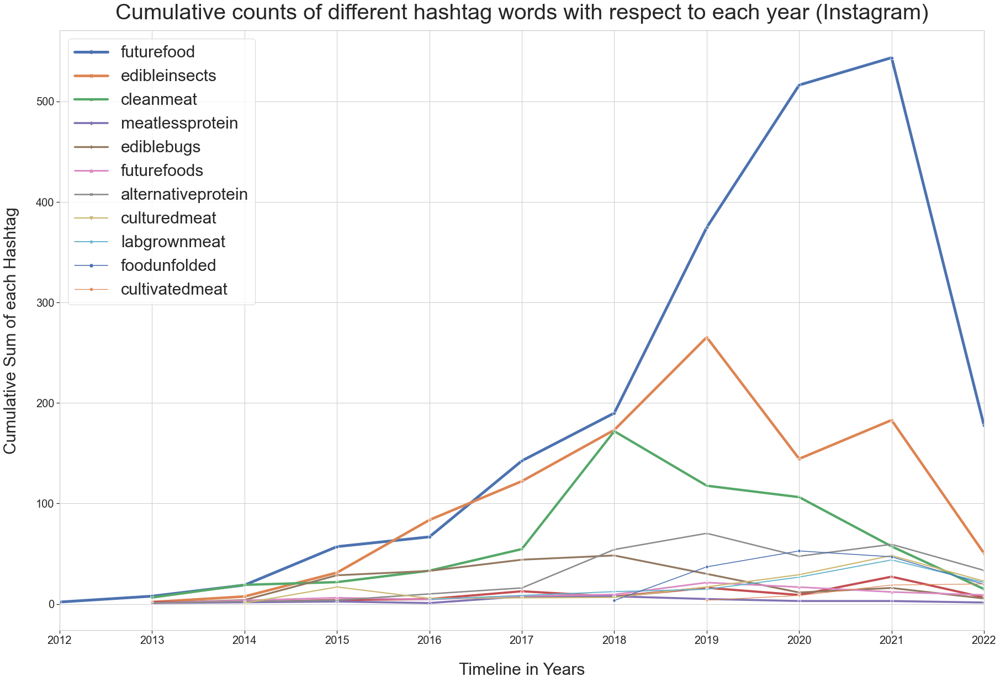

In [16]:
# df4_ins contains HASHTAG column, which includes the hashtag. 
# df4_ins also contains the Post Created Date column associated with the hashtag.
# find the cumulative count of different hashtag words at a given time and put them in a new dataframe.

## Creating new dataframe called df4_ins
df4_ins = df3_ins.groupby(['Post Created Date','HASHTAG']).size().reset_index(name='count')

# parse the cells in the Hashtag column to get the hashtag words
# If there are multiple hashtags, separate them by a comma
# Replicate the original row and create a new row for each hashtag word
for i in df4_ins.index:
    # if there are more than one hashtag
    if df4_ins.iloc[i,1].find(',') != -1:
        # split the hashtag into a list, delete the white spaces
        temp_list = df4_ins.iloc[i,1].split(',')
        temp_list = [x.strip() for x in temp_list]
        # for each hashtag except the first one in temp_list, create a new row
        for j in range(0,len(temp_list)):
            # create a new row
            df4_ins.loc[i+j] = df4_ins.iloc[i,:]
            # change the hashtag word to the new hashtag word
            df4_ins.iloc[i+j,1] = temp_list[j]

df4_ins['year'] = pd.DatetimeIndex(df4_ins['Post Created Date']).year
# find the cumulative count of each hashtag word over time
df4_ins['cum_count'] = df4_ins.groupby(['HASHTAG','year'])['count'].cumsum()

## Refactoring the Date since plotting all the specific date on to the graph takes way too long to load
df4_ins.set_index('Post Created Date', inplace=True)
df4_ins.index = pd.to_datetime(df4_ins.index)
df4_ins.resample('6M').mean()
# round the cum_count to 0 decimal places
df4_ins['cum_count'] = df4_ins['cum_count'].round(0)
df4_ins.reset_index(inplace=True)
df4_ins = df4_ins.rename(columns = {'index':'Post Created Date'})
df4_ins.head()

## Plotting using seaborn
import matplotlib.ticker as ticker
custom_params = {'xtick.bottom': True,'ytick.left': True}
sns.set_theme(style="whitegrid", rc=custom_params)
f, ax = plt.subplots(figsize=(30,20))
sns.set_context(font_scale=2,rc={"lines.linewidth": 2.5})
sns.lineplot(data=df4_ins, x ='year', y='cum_count', hue='HASHTAG', style= "HASHTAG", palette='deep', legend ="auto", markers = True, dashes = False, size = "HASHTAG",ci=None)
plt.legend(prop={'size':30})
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(xlabel="Timeline in Years", fontsize=30, labelpad= 30)
plt.ylabel(ylabel="Cumulative Sum of each Hashtag",fontsize=30, labelpad=30)
ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.xlim(2012,2022)
ax.set_title("Cumulative counts of different hashtag words with respect to each year (Instagram)", fontsize=40, pad=20)


## A neat function to check the current parameters setup and we can adjust the parameters accordingly
# sns.axes_style()

##ax.legend(loc='upper left', handlelength=10, borderpad=4, labelspacing=3)
##plt.show()


,count,year,cum_count
Post Created Date,,,
2013-05-31,2.000000,2013.000000,4.750000
2013-11-30,1.304348,2013.000000,11.391304
2014-05-31,1.166667,2013.833333,9.944444
2014-11-30,1.238095,2014.000000,17.952381
2015-05-31,1.142857,2014.897959,9.632653
2015-11-30,1.082192,2015.000000,18.821918
2016-05-31,1.224490,2015.911565,18.006803
2016-11-30,1.342342,2016.000000,52.225225
2017-05-31,1.216080,2016.904523,27.407035


,Post Created Date,HASHTAG,count,year,cum_count
0,2013-05-15,,1,2013,1
1,2013-05-16,,2,2013,3
2,2013-05-28,,4,2013,7
3,2013-05-30,,1,2013,8
4,2013-06-02,,2,2013,10


<AxesSubplot:xlabel='year', ylabel='cum_count'>

(array([2012., 2014., 2016., 2018., 2020., 2022., 2024.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([-50.,   0.,  50., 100., 150., 200., 250., 300., 350.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

Text(0.5, 0, 'Timeline in Years')

Text(0, 0.5, 'Cumulative Sum of each Hashtag')

(2012.0, 2022.0)

Text(0.5, 1.0, 'Cumulative counts of different hashtag words with respect to each year (Facebook)')

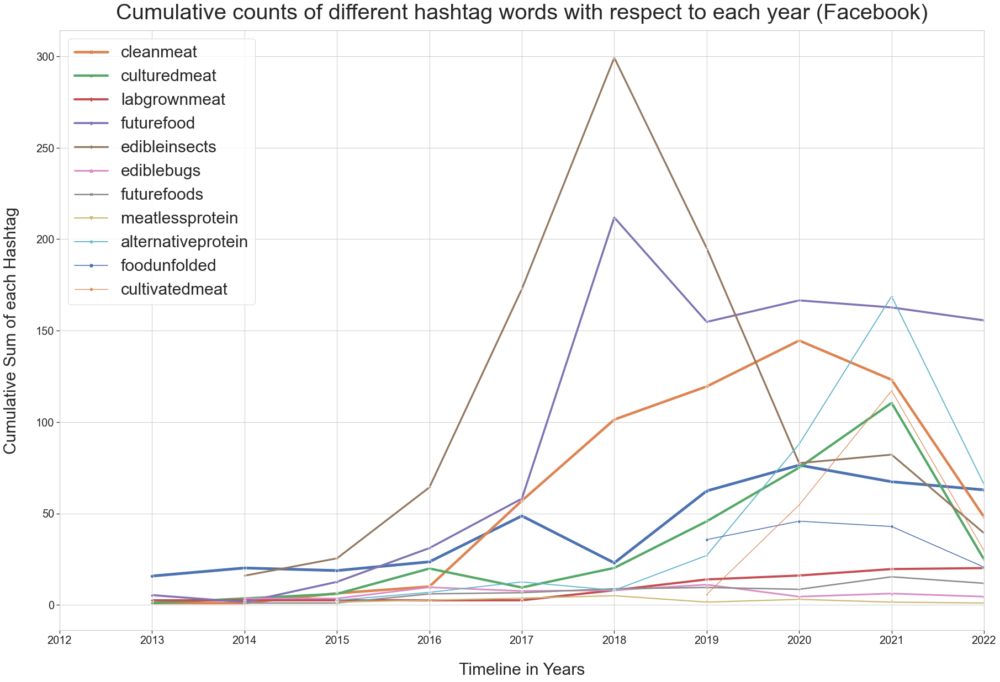

In [17]:
# df4_face contains HASHTAG column, which includes the hashtag. 
# df4_face also contains the Post Created Date column associated with the hashtag.
# find the cumulative count of different hashtag words at a given time and put them in a new dataframe.

## Creating new dataframe called df4_face
df4_face = df3_face.groupby(['Post Created Date','HASHTAG']).size().reset_index(name='count')

# parse the cells in the Hashtag column to get the hashtag words
# If there are multiple hashtags, separate them by a comma
# Replicate the original row and create a new row for each hashtag word
for i in df4_face.index:
    # if there are more than one hashtag
    if df4_face.iloc[i,1].find(',') != -1:
        # split the hashtag into a list, delete the white spaces
        temp_list_face = df4_face.iloc[i,1].split(',')
        temp_list_face = [x.strip() for x in temp_list_face]
        # for each hashtag except the first one in temp_list_face, create a new row
        for j in range(0,len(temp_list_face)):
            # create a new row
            df4_face.loc[i+j] = df4_face.iloc[i,:]
            # change the hashtag word to the new hashtag word
            df4_face.iloc[i+j,1] = temp_list_face[j]

df4_face['year'] = pd.DatetimeIndex(df4_face['Post Created Date']).year
# find the cumulative count of each hashtag word over time
df4_face['cum_count'] = df4_face.groupby(['HASHTAG','year'])['count'].cumsum()

## Refactoring the Date since plotting all the specific date on to the graph takes way too long to load
df4_face.set_index('Post Created Date', inplace=True)
df4_face.index = pd.to_datetime(df4_face.index)
df4_face.resample('6M').mean()
# round the cum_count to 0 decimal places
df4_face['cum_count'] = df4_face['cum_count'].round(0)
df4_face.reset_index(inplace=True)
df4_face = df4_face.rename(columns = {'index':'Post Created Date'})
df4_face.head()

## Plotting using seaborn
import matplotlib.ticker as ticker
custom_params = {'xtick.bottom': True,'ytick.left': True}
sns.set_theme(style="whitegrid", rc=custom_params)
f, ax = plt.subplots(figsize=(30,20))
sns.set_context(font_scale=2,rc={"lines.linewidth": 2.5})
sns.lineplot(data=df4_face, x ='year', y='cum_count', hue='HASHTAG', style= "HASHTAG", palette='deep', legend ="auto", markers = True, dashes = False, size = "HASHTAG", ci=None)
plt.legend(prop={'size':30})
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(xlabel="Timeline in Years", fontsize=30, labelpad= 30)
plt.ylabel(ylabel="Cumulative Sum of each Hashtag",fontsize=30, labelpad=30)
ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.xlim(2012,2022)
ax.set_title("Cumulative counts of different hashtag words with respect to each year (Facebook)", fontsize=40, pad=20)

## A neat function to check the current parameters setup and we can adjust the parameters accordingly
# sns.axes_style()

##ax.legend(loc='upper left', handlelength=10, borderpad=4, labelspacing=3)
##plt.show()


## Unsuccessful attempt using pd.melt to smash wide dataframe into a long one

df4 = df3.sort_values('Post Created Date')
tag_unique = pd.unique(tag_pool)
for tag in tag_unique:
    df4[tag] = df4['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)
    df4[tag] = np.cumsum(df4[tag])

df_lineplot =df4[["Post Created Date","alternativeprotein","foodunfolded","futurefood","meatlessprotein","labgrownmeat","cultivatedmeat","cleanmeat","culturedmeat","edibleinsects","futurefoods","ediblebugs"]]
df_lineplot_melt = df_lineplot.melt(id_vars = ['Post Created Date'], value_name="cumsum")

df_lineplot_melt.set_index("Post Created Date", inplace=True)
df_lineplot_melt.index = pd.to_datetime(df_lineplot_melt.index)
df_lineplot_melt.resample('6M').mean()
# round the cum_count to 0 decimal places
df_lineplot_melt['cumsum'] = df_lineplot_melt['cumsum'].round(0)
df_lineplot_melt.reset_index(inplace=True)
df_lineplot_melt = df_lineplot_melt.rename(columns = {'index':'Post Created Date'})

## Plotting a graph to see how Cumulative Sum changes over time using matplotlib
df4 = df3.sort_values('Post Created Date')
tag_unique = pd.unique(tag_pool)
for tag in tag_unique:
    df4[tag] = df4['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)
    df4[tag] = np.cumsum(df4[tag])

fig, ax = plt.subplots(figsize=(10, 6), dpi=200)
df4.set_index('Post Created Date')[tag_unique.tolist()].plot.line(ax=ax)
ax.set_title('Cumulative counts of different hashtag words at a given time')
plt.show()

In [17]:
# Tirmming Df5 for Instagram
df5_ins = df3_ins.sort_values('id')
tag_unique = pd.unique(tag_pool)
for tag in tag_unique:
    df5_ins[tag] = df5_ins['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)

df5_ins_trimmed = df5_ins.apply(lambda x: x.str.replace(' ', '') if x.dtype == "object" else x)
df5_ins_trimmed["Total Interactions"] = pd.to_numeric(df5_ins_trimmed["Total Interactions"])

In [18]:
# Tirmming Df5 for Facebook
df5_face = df3_face.sort_values('id')
tag_unique_face = pd.unique(tag_pool_face)
for tag in tag_unique_face:
    df5_face[tag] = df5_face['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)

df5_face_trimmed = df5_face.apply(lambda x: x.str.replace(' ', '') if x.dtype == "object" else x)
df5_face_trimmed["Total Interactions"] = pd.to_numeric(df5_face_trimmed["Total Interactions"])

<AxesSubplot:xlabel='Hashtags', ylabel='Sum of Total Interactions'>

Text(0.5, 1.0, 'Total Interactions count for every different hashtag')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Sum of Total Interactions')

(array([      0.,  200000.,  400000.,  600000.,  800000., 1000000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'edibleinsects'),
  Text(3, 0, 'foodunfolded'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'alternativeprotein'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'meatlessprotein'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'edibleinsects'),
  Text(3, 0, 'foodunfolded'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'alternativeprotein'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'meatlessprotein'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

Text(-0.2, 897845.0, '892845')

Text(-0.2, 937845.0, '36.6%')

Text(0.8, 391532.0, '386532')

Text(0.8, 431532.0, '15.9%')

Text(1.8, 315366.0, '310366')

Text(1.8, 355366.0, '12.7%')

Text(2.8, 267545.0, '262545')

Text(2.8, 307545.0, '10.8%')

Text(3.8, 185525.0, '180525')

Text(3.8, 225525.0, '7.4%')

Text(4.8, 136205.0, '131205')

Text(4.8, 176205.0, '5.4%')

Text(5.8, 79034.0, '74034')

Text(5.8, 119034.0, '3.0%')

Text(6.8, 71356.0, '66356')

Text(6.8, 111356.0, '2.7%')

Text(7.8, 66223.0, '61223')

Text(7.8, 106223.0, '2.5%')

Text(8.8, 53993.0, '48993')

Text(8.8, 93993.0, '2.0%')

Text(9.8, 27422.0, '22422')

Text(9.8, 67422.0, '0.9%')

Text(0.2, 35293.0, '53487')

Text(0.2, 75293.0, '31.0%')

Text(1.2, 5827.0, '30293')

Text(1.2, 45827.0, '17.5%')

Text(2.2, 30639.0, '29469')

Text(2.2, 70639.0, '17.1%')

Text(3.2, 8798.0, '25639')

Text(3.2, 48798.0, '14.8%')

Text(4.2, 11630.0, '8467')

Text(4.2, 51630.0, '4.9%')

Text(5.2, 34469.0, '8253')

Text(5.2, 74469.0, '4.8%')

Text(6.2, 5965.0, '6630')

Text(6.2, 45965.0, '3.8%')

Text(7.2, 13253.0, '4906')

Text(7.2, 53253.0, '2.8%')

Text(8.2, 13467.0, '3798')

Text(8.2, 53467.0, '2.2%')

Text(9.2, 9906.0, '965')

Text(9.2, 49906.0, '0.6%')

Text(10.2, 58487.0, '827')

Text(10.2, 98487.0, '0.5%')

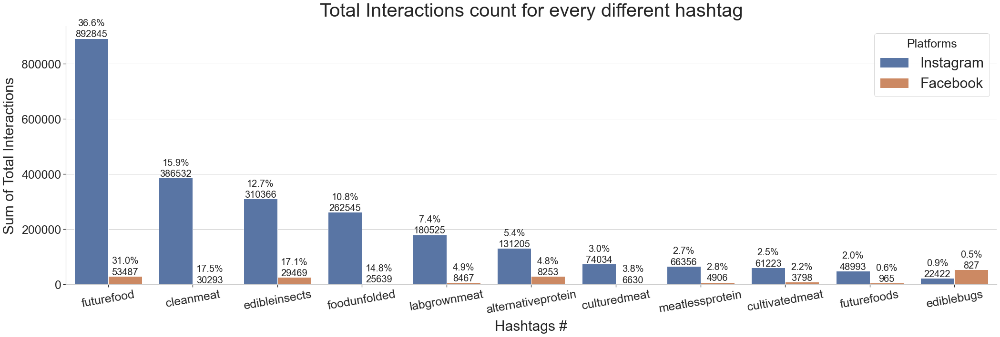

In [19]:
## Use the trimmed df5 to create new dataframe for Instagram
tsum_list_ins = []
for tag in tag_unique:  
    tsum_list_ins.append(df5_ins_trimmed.loc[df5_ins[tag] ==1, 'Total Interactions'].sum())

## Use the trimmed df5 to create new dataframe for Facebook
tsum_list_face = []
for tag in tag_unique:  
    tsum_list_face.append(df5_face_trimmed.loc[df5_face[tag] ==1, 'Total Interactions'].sum())


tsum_df_ins = pd.DataFrame({"Sum of Total Interactions" : tsum_list_ins}, index = tag_unique.tolist())
tsum_df_ins.sort_values('Sum of Total Interactions',ascending = False, inplace = True)
tsum_df_ins.reset_index(inplace=True)
tsum_df_ins= tsum_df_ins.rename(columns={'index':'Hashtags'})
tsum_df_ins['Percentage'] = tsum_df_ins['Sum of Total Interactions']/sum(tsum_df_ins['Sum of Total Interactions']) *100
tsum_df_ins['Platform'] = 'Instagram'

tsum_df_face = pd.DataFrame({"Sum of Total Interactions" : tsum_list_face}, index = tag_unique_face.tolist())
tsum_df_face.sort_values('Sum of Total Interactions',ascending = False, inplace = True)
tsum_df_face.reset_index(inplace=True)
tsum_df_face= tsum_df_face.rename(columns={'index':'Hashtags'})
tsum_df_face['Percentage'] = tsum_df_face['Sum of Total Interactions']/sum(tsum_df_face['Sum of Total Interactions']) *100
tsum_df_face['Platform'] = 'Facebook'

## Combine the two dataframes
tsum_df_combined = pd.concat([tsum_df_ins, tsum_df_face], ignore_index=True)

## Plotting the distribution of total intereactions for every hashtag
custom_params = {'xtick.bottom': True,'ytick.left': True}
sns.set_theme(style="whitegrid",rc=custom_params)
f, ax3 = plt.subplots(figsize=(35, 10))
sns.despine(f)
sns.barplot(x= 'Hashtags', y='Sum of Total Interactions', data=tsum_df_combined, hue='Platform')
plt.title('Total Interactions count for every different hashtag',fontsize= 40, pad=20)
plt.xlabel('Hashtags #',fontsize=30, labelpad= 10)
plt.ylabel('Sum of Total Interactions',fontsize=30, labelpad= 10)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation=10)
plt.legend(title = "Platforms",fontsize = 30, title_fontsize = 25)

## Putting labels of count and percentage on top of each bar in the graph

patches2 = ax3.patches
for i in range(len(patches2)):
   x1 = patches2[i].get_x() + patches2[i].get_width()/2
   y1 = patches2[i].get_height() +5000
   z1 = patches2[i].get_height() +45000

   ax3.annotate('{:}'.format(tsum_df_combined['Sum of Total Interactions'][i]), (x1, y1), ha='center',fontsize= 20)
   ax3.annotate('{:.1f}%'.format(tsum_df_combined['Percentage'][i]), (x1, z1), ha='center',fontsize= 20)
plt.show()

<AxesSubplot:xlabel='Hashtags', ylabel='Sum of Likes'>

Text(0.5, 1.0, 'Total number of Likes for every different hashtag')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Total number of likes')

(array([      0.,  200000.,  400000.,  600000.,  800000., 1000000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'edibleinsects'),
  Text(3, 0, 'foodunfolded'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'alternativeprotein'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'meatlessprotein'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'edibleinsects'),
  Text(3, 0, 'foodunfolded'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'alternativeprotein'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'meatlessprotein'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

Text(-0.2, 868112.0, '863112')

Text(-0.2, 903112.0, '36.7%')

Text(0.8, 378655.0, '373655')

Text(0.8, 413655.0, '15.9%')

Text(1.8, 301379.0, '296379')

Text(1.8, 336379.0, '12.6%')

Text(2.8, 261640.0, '256640')

Text(2.8, 296640.0, '10.9%')

Text(3.8, 177622.0, '172622')

Text(3.8, 212622.0, '7.3%')

Text(4.8, 132577.0, '127577')

Text(4.8, 167577.0, '5.4%')

Text(5.8, 76128.0, '71128')

Text(5.8, 111128.0, '3.0%')

Text(6.8, 70296.0, '65296')

Text(6.8, 105296.0, '2.8%')

Text(7.8, 64244.0, '59244')

Text(7.8, 99244.0, '2.5%')

Text(8.8, 52673.0, '47673')

Text(8.8, 87673.0, '2.0%')

Text(9.8, 26557.0, '21557')

Text(9.8, 61557.0, '0.9%')

Text(0.2, 29091.0, '40353')

Text(0.2, 64091.0, '38.5%')

Text(1.2, 45353.0, '24091')

Text(1.2, 80353.0, '23.0%')

Text(2.2, 19896.0, '14896')

Text(2.2, 54896.0, '14.2%')

Text(3.2, 5616.0, '6872')

Text(3.2, 40616.0, '6.6%')

Text(4.2, 8333.0, '4858')

Text(4.2, 43333.0, '4.6%')

Text(5.2, 9703.0, '4703')

Text(5.2, 44703.0, '4.5%')

Text(6.2, 9858.0, '3333')

Text(6.2, 44858.0, '3.2%')

Text(7.2, 5686.0, '3014')

Text(7.2, 40686.0, '2.9%')

Text(8.2, 8014.0, '1352')

Text(8.2, 43014.0, '1.3%')

Text(9.2, 11872.0, '686')

Text(9.2, 46872.0, '0.7%')

Text(10.2, 6352.0, '616')

Text(10.2, 41352.0, '0.6%')

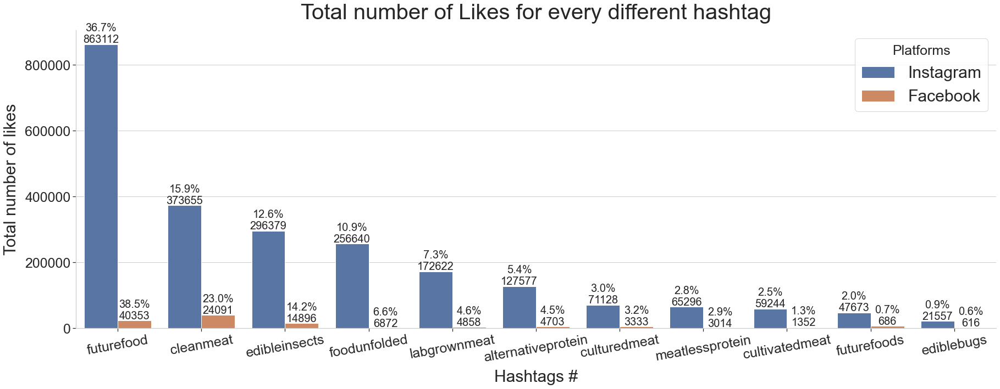

In [20]:
## Dataframe to include columns to identify likes
df6_ins = df3_ins.sort_values('id')
for tag in tag_unique:
    df6_ins[tag] = df6_ins['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)

df6_face = df3_face.sort_values('id')
for tag in tag_unique_face:
    df6_face[tag] = df6_face['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)

likes_list = []
for tag in tag_unique:  
    likes_list.append(df6_ins.loc[df6_ins[tag] == 1, 'Likes'].sum())

likes_list_face = []
for tag in tag_unique_face:  
    likes_list_face.append(df6_face.loc[df6_face[tag] == 1, 'Likes'].sum())


likes_df_ins = pd.DataFrame({"Sum of Likes" : likes_list}, index = tag_unique.tolist())
likes_df_ins.sort_values('Sum of Likes',ascending = False, inplace = True)
likes_df_ins.reset_index(inplace=True)
likes_df_ins= likes_df_ins.rename(columns={'index':'Hashtags'})
likes_df_ins['Percentage'] = likes_df_ins['Sum of Likes']/sum(likes_df_ins['Sum of Likes']) *100
likes_df_ins['Platform'] = 'Instagram'

likes_df_face = pd.DataFrame({"Sum of Likes" : likes_list_face}, index = tag_unique_face.tolist())
likes_df_face.sort_values('Sum of Likes',ascending = False, inplace = True)
likes_df_face.reset_index(inplace=True)
likes_df_face= likes_df_face.rename(columns={'index':'Hashtags'})
likes_df_face['Percentage'] = likes_df_face['Sum of Likes']/sum(likes_df_face['Sum of Likes']) *100
likes_df_face['Platform'] = 'Facebook'

## Combine the two dataframes
likes_df_combined = pd.concat([likes_df_ins, likes_df_face], ignore_index=True)

## Plotting Total number of likes for every different hashtag
custom_params = {'xtick.bottom': True,'ytick.left': True}
sns.set_theme(style="whitegrid",rc=custom_params)
f, ax4 = plt.subplots(figsize=(30, 10))
sns.despine(f)
sns.barplot(x= 'Hashtags', y='Sum of Likes', data=likes_df_combined, hue='Platform')
plt.title('Total number of Likes for every different hashtag',fontsize= 40, pad=20)
plt.xlabel('Hashtags #',fontsize=30, labelpad= 10)
plt.ylabel('Total number of likes',fontsize=30, labelpad= 10)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation=10)
plt.legend(title = "Platforms",fontsize = 30, title_fontsize = 25)

## Putting labels of count and percentage on top of each bar in the graph

patches3 = ax4.patches
for i in range(len(patches3)):
   x2 = patches3[i].get_x() + patches3[i].get_width()/2
   y2 = patches3[i].get_height() +5000
   z2 = patches3[i].get_height() +40000

   ax4.annotate('{:}'.format(likes_df_combined['Sum of Likes'][i]), (x2, y2), ha='center',fontsize= 20)
   ax4.annotate('{:.1f}%'.format(likes_df_combined['Percentage'][i]), (x2, z2), ha='center',fontsize= 20)
plt.show()

<AxesSubplot:xlabel='Hashtags', ylabel='Sum of Comments'>

Text(0.5, 1.0, 'Total number of Comments for every different hashtag')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Total number of Comments')

(array([    0.,  5000., 10000., 15000., 20000., 25000., 30000., 35000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'labgrownmeat'),
  Text(4, 0, 'foodunfolded'),
  Text(5, 0, 'alternativeprotein'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'cultivatedmeat'),
  Text(8, 0, 'futurefoods'),
  Text(9, 0, 'meatlessprotein'),
  Text(10, 0, 'ediblebugs')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'futurefood'),
  Text(1, 0, 'edibleinsects'),
  Text(2, 0, 'cleanmeat'),
  Text(3, 0, 'labgrownmeat'),
  Text(4, 0, 'foodunfolded'),
  Text(5, 0, 'alternativeprotein'),
  Text(6, 0, 'culturedmeat'),
  Text(7, 0, 'cultivatedmeat'),
  Text(8, 0, 'futurefoods'),
  Text(9, 0, 'meatlessprotein'),
  Text(10, 0, 'ediblebugs')])

Text(-0.2, 29883.0, '29733')

Text(-0.2, 31033.0, '36.2%')

Text(0.8, 14137.0, '13987')

Text(0.8, 15287.0, '17.0%')

Text(1.8, 13027.0, '12877')

Text(1.8, 14177.0, '15.7%')

Text(2.8, 8053.0, '7903')

Text(2.8, 9203.0, '9.6%')

Text(3.8, 6055.0, '5905')

Text(3.8, 7205.0, '7.2%')

Text(4.8, 3778.0, '3628')

Text(4.8, 4928.0, '4.4%')

Text(5.8, 3056.0, '2906')

Text(5.8, 4206.0, '3.5%')

Text(6.8, 2129.0, '1979')

Text(6.8, 3279.0, '2.4%')

Text(7.8, 1470.0, '1320')

Text(7.8, 2620.0, '1.6%')

Text(8.8, 1210.0, '1060')

Text(8.8, 2360.0, '1.3%')

Text(9.8, 1015.0, '865')

Text(9.8, 2165.0, '1.1%')

Text(0.2, 1613.0, '3738')

Text(0.2, 2763.0, '28.0%')

Text(1.2, 3888.0, '2565')

Text(1.2, 5038.0, '19.2%')

Text(2.2, 2622.0, '2472')

Text(2.2, 3772.0, '18.5%')

Text(3.2, 2715.0, '1463')

Text(3.2, 3865.0, '10.9%')

Text(4.2, 171.0, '936')

Text(4.2, 1321.0, '7.0%')

Text(5.2, 604.0, '624')

Text(5.2, 1754.0, '4.7%')

Text(6.2, 1086.0, '576')

Text(6.2, 2236.0, '4.3%')

Text(7.2, 726.0, '454')

Text(7.2, 1876.0, '3.4%')

Text(8.2, 599.0, '449')

Text(8.2, 1749.0, '3.4%')

Text(9.2, 218.0, '68')

Text(9.2, 1368.0, '0.5%')

Text(10.2, 774.0, '21')

Text(10.2, 1924.0, '0.2%')

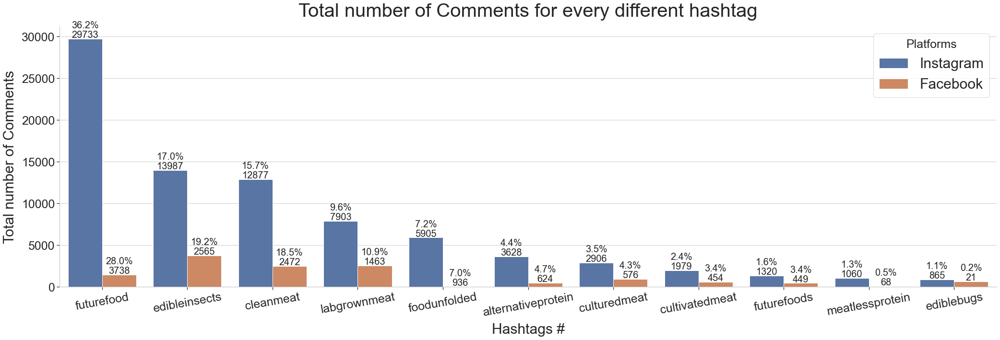

In [21]:
## Creating new dataframe to inlcude sum for comments
df7_ins = df3_ins.sort_values('id')
for tag in tag_unique:
    df7_ins[tag] = df7_ins['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)

df7_face = df3_face.sort_values('id')
for tag in tag_unique_face:
    df7_face[tag] = df7_face['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)

Comments_list = []
for tag in tag_unique:  
    Comments_list.append(df7_ins.loc[df7_ins[tag] == 1, 'Comments'].sum())

Comments_list_face = []
for tag in tag_unique_face:  
    Comments_list_face.append(df7_face.loc[df7_face[tag] == 1, 'Comments'].sum())


Comments_df_ins = pd.DataFrame({"Sum of Comments" : Comments_list}, index = tag_unique.tolist())
Comments_df_ins.sort_values('Sum of Comments',ascending = False, inplace = True)
Comments_df_ins.reset_index(inplace=True)
Comments_df_ins= Comments_df_ins.rename(columns={'index':'Hashtags'})
Comments_df_ins['Percentage'] = Comments_df_ins['Sum of Comments']/sum(Comments_df_ins['Sum of Comments']) *100
Comments_df_ins['Platform'] = 'Instagram'

Comments_df_face = pd.DataFrame({"Sum of Comments" : Comments_list_face}, index = tag_unique_face.tolist())
Comments_df_face.sort_values('Sum of Comments',ascending = False, inplace = True)
Comments_df_face.reset_index(inplace=True)
Comments_df_face= Comments_df_face.rename(columns={'index':'Hashtags'})
Comments_df_face['Percentage'] = Comments_df_face['Sum of Comments']/sum(Comments_df_face['Sum of Comments']) *100
Comments_df_face['Platform'] = 'Facebook'

## Combine the two dataframes
Comments_df_combined = pd.concat([Comments_df_ins, Comments_df_face], ignore_index=True)

## Plotting Total number of likes for every different hashtag
custom_params = {'xtick.bottom': True,'ytick.left': True}
sns.set_theme(style="whitegrid",rc=custom_params)
f, ax5 = plt.subplots(figsize=(35, 10))
sns.despine(f)
sns.barplot(x= 'Hashtags', y='Sum of Comments', data=Comments_df_combined, hue="Platform")
plt.title('Total number of Comments for every different hashtag',fontsize= 40, pad=20)
plt.xlabel('Hashtags #',fontsize=30, labelpad= 10)
plt.ylabel('Total number of Comments',fontsize=30, labelpad= 10)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation=10)
plt.legend(title = "Platforms",fontsize = 30, title_fontsize = 25)

## Putting labels of count and percentage on top of each bar in the graph

patches4 = ax5.patches
for i in range(len(patches4)):
   x3 = patches4[i].get_x() + patches4[i].get_width()/2
   y3 = patches4[i].get_height() +150
   z3 = patches4[i].get_height() +1300

   ax5.annotate('{:}'.format(Comments_df_combined['Sum of Comments'][i]), (x3, y3), ha='center',fontsize= 20)
   ax5.annotate('{:.1f}%'.format(Comments_df_combined['Percentage'][i]), (x3, z3), ha='center',fontsize= 20)
plt.show()

,id,Account,User Name,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Views,Like and View Counts Disabled,URL,Photo,Description,Image Text,Sponsor Id,Sponsor Name,Overperforming Score,HASHTAG,alternativeprotein,foodunfolded,futurefood,meatlessprotein,labgrownmeat,cultivatedmeat,cleanmeat,culturedmeat,edibleinsects,futurefoods,ediblebugs
0,0,Genelia Deshmukh,geneliad,7291844.0,2021-10-16 05:22:21 EDT,2021-10-16,05:22:21,Album,49 779,49634,145,0,False,https://www.instagram.com/p/CVFZVlsogvO/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/246276386_246951120783485_3238136309611538599_n.jpg?_nc_cat=104&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=OnNeGx8TluQAX9UBzao&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9usnNIWXLUn-EHWuNd7z1LzLTyIMDnp3FRQv_TAmb1fg&oe=62E48BAF,"#worldfoodday2021 \n\n We need to make our food - our investment into our health, our being and all the other beings that exist and most importantly our planet 💚\n\nLet’s change our planet - One bite at a time..\n\nWww.imaginemeats.com\n\n•\n#ImagineMeats #ImagineChicken #ImagineMutton #Plantbased #Plantbasedmeat #Plantlover #Happymeat #Meatfree #Meatlesseveryday #alternativeprotein #Meatlessmeat #Crueltyfree #worldfoodday2021",NaN,NaN,NaN,-6.16,alternativeprotein,1,0,0,0,0,0,0,0,0,0,0
1,1,The N kitchen,blend.of.spices,NaN,2022-01-05 11:13:43 EST,2022-01-05,11:13:43,Album,46 189,46025,164,0,False,https://www.instagram.com/p/CYWszc_PzsB/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/271304997_228085712837104_2842214994172471325_n.jpg?_nc_cat=106&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=qrjgj-0YJ64AX81LGaA&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9ZaF0DwmVaaKX54JYylFWwTebxIRkUR3PJ9z5Bnyx8uw&oe=62E44E12,Swipe left to Choose your favorite chole combo ➡️➡️ \n. \n1. Chole Bhature 🍱🍱\n. \n2. Chole Samosa🧆🧆\n. \n3. Chole Paratha🥙🥙\n. \n4. Chole Kulcha🥘🥘\n. \n5. Chole Chawal🍛🍛\n. \n6. Chole Kachori🍲🍲\n. \n7. Chole Naan🌮🌮\n. \n8. Chole Tikki🍝🍝\n. \n9. Chole Poori🍜🍜\n\nComment down your favourite combo and for more such updates follow @blend.of.spices @blend.of.spices \n@blend.of.spices @blend.of.spices \n\n#choleplatter #cholecombo #cholebhature #cholechawal #cholepoori #kulcha #tikki #samose #kachori #naan #paratha #delhigram #delhieats #delhifood #foodiesofinstagram #foodcontest #foodcompetition #comment #foodgasm #foodblogger #indianfoodblogger #noidaeats #calcuttafoodie #punjabifood #amritsari #foodunfolded,NaN,NaN,NaN,0,foodunfolded,0,1,0,0,0,0,0,0,0,0,0
2,2,Moving Mountains Foods,movingmountainsfoods,24100.0,2021-01-08 05:00:06 EST,2021-01-08,05:00:06,Photo,31 126,30857,269,0,False,https://www.instagram.com/p/CJx6SQis_Qh/,NaN,"📣 ANNOUNCEMENT📣\n \nWe have just launched the meatiest plant-based product in the world! Introducing our brand new plant-based Beef Tender Strips 🎉 Now available from @Sainsburys - find them in the frozen aisle!\n \nTo learn more about our #OutrageouslyMeaty product, tap the link in our bio.\n.\n.\n.\n#MovingMountains #meatmadefromplants #plantbasedbeef #vegancommunity #whatveganseat #vegannews #sustainablefood #veganchef #plantbased #futurefood #plantpower #healthyeating #plantbasedfood #veganbeef #veganmeat",NaN,NaN,NaN,80.22,futurefood,0,0,1,0,0,0,0,0,0,0,0
3,3,www.melissas.com,melissasproduce,74828.0,2021-04-09 21:35:07 EDT,2021-04-09,21:35:07,Photo,20 938,20855,83,0,False,https://www.instagram.com/p/CNd5nvNDUN4/,https://scontent-sea1-1.cdninstagram.com/v/t51.2885-15/170374983_913633265878490_2541226670276993394_n.jpg?_nc_cat=100&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=LHf1_n4afjUAX8MBg35&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT_M0sFOGda7oRnBVI4cqnXPT3ASoTUVj3A1gqbm4HApUw&oe=62E5276B,We really love this easy guide by @nutritional_factz with plant based protein alternatives if you're limiting or not eating animal protein. Which one are you most surprised by? 🤓 \n•\n•\n•\n•\n•\n•\n#melissasproduce #melissas #produce #losangeles #melissasproducecompany #plantbased #plantprotein #prote

[247619, 2792820, 2570181, 4603, 590647, 175647, 767840, 1012604, 694742, 445351, 64909]


<AxesSubplot:xlabel='Hashtags', ylabel='Sum of Views'>

Text(0.5, 1.0, 'Total number of Views for every different hashtag')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Total number of Views')

(array([      0.,  500000., 1000000., 1500000., 2000000., 2500000.,
        3000000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'foodunfolded'),
  Text(1, 0, 'futurefood'),
  Text(2, 0, 'culturedmeat'),
  Text(3, 0, 'cleanmeat'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'labgrownmeat'),
  Text(6, 0, 'futurefoods'),
  Text(7, 0, 'alternativeprotein'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'ediblebugs'),
  Text(10, 0, 'meatlessprotein')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'foodunfolded'),
  Text(1, 0, 'futurefood'),
  Text(2, 0, 'culturedmeat'),
  Text(3, 0, 'cleanmeat'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'labgrownmeat'),
  Text(6, 0, 'futurefoods'),
  Text(7, 0, 'alternativeprotein'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'ediblebugs'),
  Text(10, 0, 'meatlessprotein')])

Text(0.0, 2807820.0, '2792820')

Text(0.0, 2922820.0, '29.8%')

Text(1.0, 2585181.0, '2570181')

Text(1.0, 2700181.0, '27.4%')

Text(2.0, 1027604.0, '1012604')

Text(2.0, 1142604.0, '10.8%')

Text(3.0, 782840.0, '767840')

Text(3.0, 897840.0, '8.2%')

Text(4.0, 709742.0, '694742')

Text(4.0, 824742.0, '7.4%')

Text(5.0, 605647.0, '590647')

Text(5.0, 720647.0, '6.3%')

Text(6.0, 460351.0, '445351')

Text(6.0, 575351.0, '4.8%')

Text(7.0, 262619.0, '247619')

Text(7.0, 377619.0, '2.6%')

Text(8.0, 190647.0, '175647')

Text(8.0, 305647.0, '1.9%')

Text(9.0, 79909.0, '64909')

Text(9.0, 194909.0, '0.7%')

Text(10.0, 19603.0, '4603')

Text(10.0, 134603.0, '0.0%')

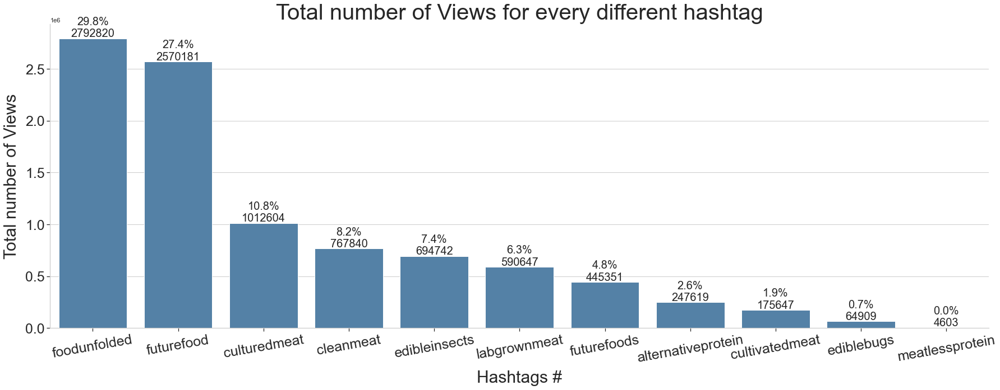

In [22]:
## Views
df8_ins = df3_ins.sort_values('id')
for tag in tag_unique:
    df8_ins[tag] = df8_ins['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)
df8_ins.head()

Views_list = []
for tag in tag_unique:  
    Views_list.append(df8_ins.loc[df8_ins[tag] == 1, 'Views'].sum())

print(Views_list)
Views_df_ins = pd.DataFrame({"Sum of Views" : Views_list}, index = tag_unique.tolist())
Views_df_ins.sort_values('Sum of Views',ascending = False, inplace = True)
Views_df_ins.reset_index(inplace=True)
Views_df_ins= Views_df_ins.rename(columns={'index':'Hashtags'})
Views_df_ins['Percentage'] = Views_df_ins['Sum of Views']/sum(Views_df_ins['Sum of Views']) *100

## Plotting Total number of Views for every different hashtag
custom_params = {'xtick.bottom': True,'ytick.left': True}
sns.set_theme(style="whitegrid",rc=custom_params)
f, ax6 = plt.subplots(figsize=(30, 10))
sns.despine(f)
sns.barplot(x= 'Hashtags', y='Sum of Views', data= Views_df_ins, color="steelblue")
plt.title('Total number of Views for every different hashtag',fontsize= 40)
plt.xlabel('Hashtags #',fontsize=30, labelpad= 10)
plt.ylabel('Total number of Views',fontsize=30, labelpad= 10)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation=10)
## Putting labels of count and percentage on top of each bar in the graph

patches5 = ax6.patches
for i in range(len(patches5)):
   x4 = patches5[i].get_x() + patches5[i].get_width()/2
   y4 = patches5[i].get_height() +15000
   z4 = patches5[i].get_height() +130000

   ax6.annotate('{:}'.format(Views_df_ins['Sum of Views'][i]), (x4, y4), ha='center',fontsize= 20)
   ax6.annotate('{:.1f}%'.format(Views_df_ins['Percentage'][i]), (x4, z4), ha='center',fontsize= 20)
plt.show()

,id,Page Name,User Name,Facebook Id,Page Category,Page Admin Top Country,Page Description,Page Created,Likes at Posting,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Shares,Love,Wow,Haha,Sad,Angry,Care,Video Share Status,Is Video Owner?,Post Views,Total Views,Total Views For All Crossposts,Video Length,URL,Message,Link,Final Link,Image Text,Link Text,Description,Sponsor Id,Sponsor Name,Sponsor Category,Overperforming Score,HASHTAG,labgrownmeat,cleanmeat,futurefood,culturedmeat,edibleinsects,futurefoods,ediblebugs,cultivatedmeat,alternativeprotein,meatlessprotein,foodunfolded
0,0,End Time Headlines,endtimeheadline,100044353509856,PERSONAL_BLOG,US,News and Headlines from a “Prophetic Perspective”,2010-07-01 15:23:48,559945.0,548028.0,2020-05-10 17:52:18 PDT,2020-05-10,17:52:18,Link,11 645,290,654,8455,4,416,9,140,1676,1,NaN,-,0,0,0,NaN,https://www.facebook.com/135010313189665/posts/3334488166575181,Tyson Foods is boosting its bet on meat that comes from the lab instead of the slaughterhouse and is partnering with Bill Gates and Richard Branson among other high profile backers! #labgrownmeat #foodshortage #billgates #tysonfoods,https://endtimeheadlines.org/2020/05/tyson-foods-joins-bill-gates-and-cargill-to-invest-in-lab-meat-producer/,https://endtimeheadlines.org/,NaN,"Tyson Foods Joins Bill Gates and Cargill to Invest in ""Lab-Meat Producer""","(ETH) - With all the talk about coming food shortages in America and around the world, It appears that there is future investments being made in",NaN,NaN,NaN,23.62,labgrownmeat,1,0,0,0,0,0,0,0,0,0,0
1,1,Brinc,Brinc.io,824410874258605,INTERNET_COMPANY,HK,"Headquartered in Hong Kong, Brinc is a leader in global venture acceleration, operating 18 multidisciplinary accelerator programs in 7 countries. Brinc accelerates startups focused on sustainability.",2014-08-26 09:27:10,2720.0,2905.0,2019-04-27 18:28:59 PDT,2019-04-27,18:28:59,Photo,10 001,9986,0,1,12,1,1,0,0,0,NaN,-,0,0,0,NaN,https://www.facebook.com/824410874258605/posts/2476020049097671,"Recently in collaboration with The Good Food Institute, we are delighted to release the first international edition of The Good Food Startup Manual. The manual is a 100+ page step-by-step instruction book for entrepreneurs who want to set up their own plant-based or cell-based protein startups 🌱 Read more & download: https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e#GoodFoodInstitute:=:https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e #GFI #FoodTechnology #FoodTech #Startup #CleanMeat #CulturedMeat #PlantBased #FutureFood #FoodLab #SustainableFood #Sustainability #MeatAlternatives #Vegan",https://www.facebook.com/Brinc.io/photos/a.944565612243130/2476018862431123/?type=3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,526.37,"cleanmeat, futurefood, culturedmeat",0,1,0,0,0,0,0,0,0,0,0
2,2,Legend Killer Charters,legendkillercharters,831781093546602,TOPIC_SPORTS_RECREATION,US,Saginaw Bay Walleye\nDetroit River Walleye\nSaginaw River Walleye\nLake Michigan King Salmon\nOffering fun filled fishing trips for the whole family. We pride ourselves for being a fun and educational fishing charter. Trips for all anglers!\n,2015-01-08 00:51:45,NaN,NaN,2019-04-08 18:01:02 PDT,2019-04-08,18:01:02,Native Video,5 869,819,411,4566,34,32,2,1,3,1,owned,Yes,33772,432773,0,00:01:10,https://www.facebook.com/831781093546602/posts/2294269170631113,"Filleting a walleye plus , cheeks and walleye wings! #walleye #saginawbay #walleyecharter #detroitriver #jigemup #motorcity #cleanmeat",https://www.facebook.com/legendkillercharters/videos/285843252312741/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.43,cleanmeat,0,1,0,0,0,0,0,0,0,0,0
3,3,Food Standards Agency,FoodStandardsAgency,100064659582632,GOVERNMENT_ORGANIZATION,GB,We're the Food Standards Agency. It’s our job to use our expertise and influence so that people ca,2012-10-11 14:49:48,44118.0,50267.0,2022-07-13 04:20:03

<AxesSubplot:xlabel='Hashtags', ylabel='Sum of Shares'>

Text(0.5, 1.0, 'Total number of Shares for every different hashtag (Facebook)')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Total number of Views')

(array([    0.,  2000.,  4000.,  6000.,  8000., 10000., 12000., 14000.,
        16000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'alternativeprotein'),
  Text(1, 0, 'labgrownmeat'),
  Text(2, 0, 'foodunfolded'),
  Text(3, 0, 'futurefood'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'meatlessprotein'),
  Text(6, 0, 'cleanmeat'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'ediblebugs'),
  Text(10, 0, 'futurefoods')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'alternativeprotein'),
  Text(1, 0, 'labgrownmeat'),
  Text(2, 0, 'foodunfolded'),
  Text(3, 0, 'futurefood'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'meatlessprotein'),
  Text(6, 0, 'cleanmeat'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'cultivatedmeat'),
  Text(9, 0, 'ediblebugs'),
  Text(10, 0, 'futurefoods')])

Text(0.0, 13593.0, '13493')

Text(0.0, 14093.0, '39.2%')

Text(1.0, 7821.0, '7721')

Text(1.0, 8321.0, '22.4%')

Text(2.0, 7561.0, '7461')

Text(2.0, 8061.0, '21.7%')

Text(3.0, 2223.0, '2123')

Text(3.0, 2723.0, '6.2%')

Text(4.0, 998.0, '898')

Text(4.0, 1498.0, '2.6%')

Text(5.0, 990.0, '890')

Text(5.0, 1490.0, '2.6%')

Text(6.0, 898.0, '798')

Text(6.0, 1398.0, '2.3%')

Text(7.0, 595.0, '495')

Text(7.0, 1095.0, '1.4%')

Text(8.0, 434.0, '334')

Text(8.0, 934.0, '1.0%')

Text(9.0, 250.0, '150')

Text(9.0, 750.0, '0.4%')

Text(10.0, 191.0, '91')

Text(10.0, 691.0, '0.3%')

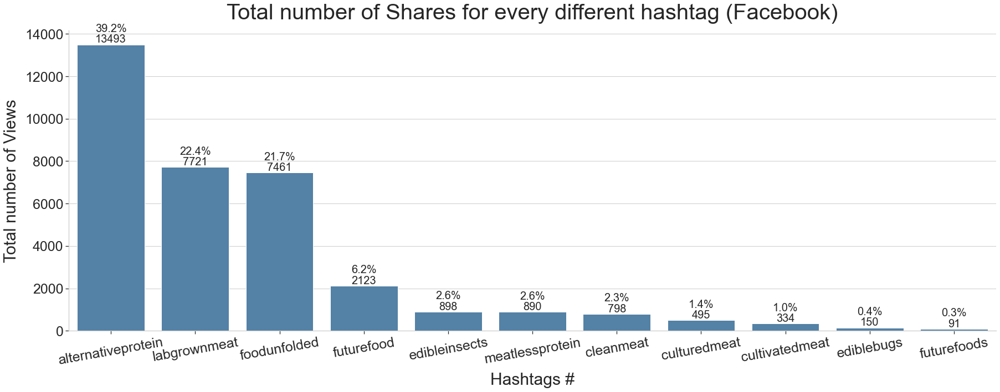

In [23]:
## Shares for Facebook
df8_face = df3_face.sort_values('id')
for tag in tag_unique_face:
    df8_face[tag] = df8_face['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)
df8_face.head()

Shares_list = []
for tag in tag_unique_face:  
    Shares_list.append(df8_face.loc[df8_face[tag] == 1, 'Shares'].sum())

Shares_df_face = pd.DataFrame({"Sum of Shares" : Shares_list}, index = tag_unique.tolist())
Shares_df_face.sort_values('Sum of Shares',ascending = False, inplace = True)
Shares_df_face.reset_index(inplace=True)
Shares_df_face= Shares_df_face.rename(columns={'index':'Hashtags'})
Shares_df_face['Percentage'] = Shares_df_face['Sum of Shares']/sum(Shares_df_face['Sum of Shares']) *100

## Plotting Total number of Views for every different hashtag
custom_params = {'xtick.bottom': True,'ytick.left': True}
sns.set_theme(style="whitegrid",rc=custom_params)
f, ax6 = plt.subplots(figsize=(30, 10))
sns.despine(f)
sns.barplot(x= 'Hashtags', y='Sum of Shares', data = Shares_df_face, color="steelblue")
plt.title('Total number of Shares for every different hashtag (Facebook)',fontsize= 40, pad=20)
plt.xlabel('Hashtags #',fontsize=30, labelpad= 10)
plt.ylabel('Total number of Views',fontsize=30, labelpad= 10)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation=10)

## Putting labels of count and percentage on top of each bar in the graph

patches6 = ax6.patches
for i in range(len(patches6)):
   x4 = patches6[i].get_x() + patches6[i].get_width()/2
   y4 = patches6[i].get_height() + 100
   z4 = patches6[i].get_height() + 600

   ax6.annotate('{:}'.format(Shares_df_face['Sum of Shares'][i]), (x4, y4), ha='center',fontsize= 20)
   ax6.annotate('{:.1f}%'.format(Shares_df_face['Percentage'][i]), (x4, z4), ha='center',fontsize= 20)
plt.show()

<AxesSubplot:xlabel='Hashtags', ylabel='Average'>

Text(0.5, 1.0, 'Total number of OverallScores for every different hashtag')

Text(0.5, 0, 'Hashtags #')

Text(0, 0.5, 'Total number of OverallScores')

(array([-14., -12., -10.,  -8.,  -6.,  -4.,  -2.,   0.,   2.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 1, 'culturedmeat'),
  Text(1, 1, 'ediblebugs'),
  Text(2, 1, 'labgrownmeat'),
  Text(3, 1, 'futurefood'),
  Text(4, 1, 'futurefoods'),
  Text(5, 1, 'cleanmeat'),
  Text(6, 1, 'alternativeprotein'),
  Text(7, 1, 'cultivatedmeat'),
  Text(8, 1, 'foodunfolded'),
  Text(9, 1, 'edibleinsects'),
  Text(10, 1, 'meatlessprotein')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 1, 'culturedmeat'),
  Text(1, 1, 'ediblebugs'),
  Text(2, 1, 'labgrownmeat'),
  Text(3, 1, 'futurefood'),
  Text(4, 1, 'futurefoods'),
  Text(5, 1, 'cleanmeat'),
  Text(6, 1, 'alternativeprotein'),
  Text(7, 1, 'cultivatedmeat'),
  Text(8, 1, 'foodunfolded'),
  Text(9, 1, 'edibleinsects'),
  Text(10, 1, 'meatlessprotein')])

Text(-0.2, -12.097262357414449, '-11.6')

Text(0.8, -5.825438596491229, '-5.3')

Text(1.8, -3.367294685990338, '-2.9')

Text(2.8, -2.7787799367374606, '-2.3')

Text(3.8, -2.3664864864864863, '-1.9')

Text(4.8, -1.8447694753577104, '-1.3')

Text(5.8, -1.7879349593495935, '-1.3')

Text(6.8, -1.6954347826086955, '-1.2')

Text(7.8, -0.6671544715447153, '-0.2')

Text(8.8, -0.5140129870129869, '-0.0')

Text(9.8, 0.5195312500000002, '0.2')

Text(0.2, -3.602534818941504, '-12.5')

Text(1.2, -2.1473972602739724, '-4.5')

Text(2.2, -13.048765432098765, '-4.4')

Text(3.2, -4.89492634060106, '-4.4')

Text(4.2, -3.54710843373494, '-4.1')

Text(5.2, -4.049999999999999, '-3.5')

Text(6.2, -4.881653846153847, '-3.2')

Text(7.2, -5.014075949367088, '-3.1')

Text(8.2, -4.571864864864866, '-3.0')

Text(9.2, -2.6052487890797003, '-2.1')

Text(10.2, -3.7047499999999998, '-1.6')

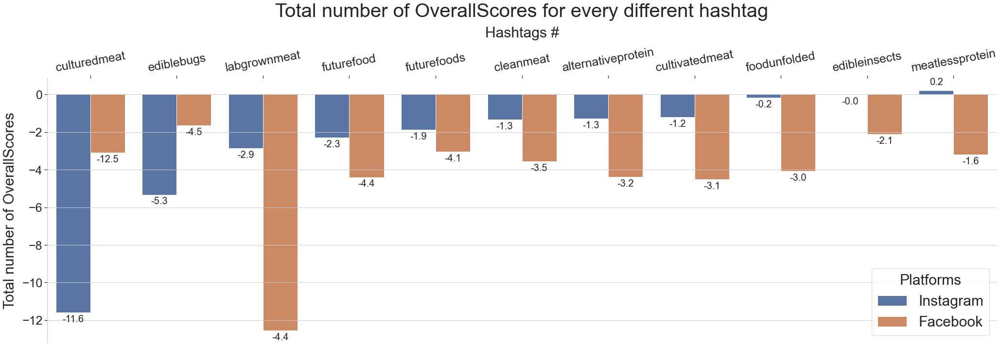

In [24]:
## OverallScores
df9_ins = df3_ins.sort_values('id')
for tag in tag_unique:
    df9_ins[tag] = df9_ins['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)

df9_face = df3_face.sort_values('id')
for tag in tag_unique_face:
    df9_face[tag] = df9_face['HASHTAG'].str.split(',').apply(lambda x: 1 if tag in x else 0)


df9_ins_trimmed = df9_ins.apply(lambda x: x.str.replace(' ', '') if x.dtype == "object" else x)
df9_ins_trimmed["Overperforming Score"] = pd.to_numeric(df9_ins_trimmed["Overperforming Score"])

df9_face_trimmed = df9_face.apply(lambda x: x.str.replace(' ', '') if x.dtype == "object" else x)
df9_face_trimmed["Overperforming Score"] = pd.to_numeric(df9_face_trimmed["Overperforming Score"])

OverallScores_list = []
OverallScores_list_length = []
OverallScores_list_Average = []
for tag in tag_unique:  
    OverallScores_list.append(df9_ins_trimmed.loc[df9_ins_trimmed[tag] == 1, 'Overperforming Score'].sum())
    OverallScores_list_length.append(df9_ins_trimmed['id'].loc[df9_ins_trimmed[tag] == 1].count())
    OverallScores_list_Average.append(df9_ins_trimmed.loc[df9_ins_trimmed[tag] == 1, 'Overperforming Score'].sum()/df9_ins_trimmed['id'].loc[df9_ins_trimmed[tag] == 1].count())

OverallScores_list_face = []
OverallScores_list_length_face = []
OverallScores_list_Average_face = []
for tag in tag_unique_face:  
    OverallScores_list_face.append(df9_face_trimmed.loc[df9_face_trimmed[tag] == 1, 'Overperforming Score'].sum())
    OverallScores_list_length_face.append(df9_face_trimmed['id'].loc[df9_face_trimmed[tag] == 1].count())
    OverallScores_list_Average_face.append(df9_face_trimmed.loc[df9_face_trimmed[tag] == 1, 'Overperforming Score'].sum()/df9_face_trimmed['id'].loc[df9_face_trimmed[tag] == 1].count())

OverallScores_df_ins = pd.DataFrame({"Sum of OverallScores" : OverallScores_list, "Count" : OverallScores_list_length, "Average": OverallScores_list_Average}, index = tag_unique.tolist())
OverallScores_df_ins.sort_values('Average',ascending = True, inplace = True)
OverallScores_df_ins.reset_index(inplace=True)
OverallScores_df_ins= OverallScores_df_ins.rename(columns={'index':'Hashtags'})
OverallScores_df_ins['Platform'] = 'Instagram'

OverallScores_df_face = pd.DataFrame({"Sum of OverallScores" : OverallScores_list_face, "Count" : OverallScores_list_length_face, "Average": OverallScores_list_Average_face}, index = tag_unique_face.tolist())
OverallScores_df_face.sort_values('Average',ascending = True, inplace = True)
OverallScores_df_face.reset_index(inplace=True)
OverallScores_df_face= OverallScores_df_face.rename(columns={'index':'Hashtags'})
OverallScores_df_face['Platform'] = 'Facebook'

OverallScores_df_combined = pd.concat([OverallScores_df_ins, OverallScores_df_face], ignore_index=True)

## Plotting Total number of OverallScores for every different hashtag
custom_params = {'ytick.left': True, 'axes.axisbelow':False, 'axes.spines.top': False, 'axes.spines.bottom': False, 'axes.spines.right': False}
sns.set_theme(style="whitegrid",rc=custom_params)
f, ax8 = plt.subplots(figsize=(35, 10))
sns.barplot(x= 'Hashtags', y='Average', data= OverallScores_df_combined, hue= 'Platform')
plt.title('Total number of OverallScores for every different hashtag',fontsize= 40, pad=20)
plt.xlabel('Hashtags #',fontsize=30, labelpad= -650)
plt.ylabel('Total number of OverallScores',fontsize=30, labelpad= 10)
ax8.xaxis.tick_top()
##plt.ylim(ymax=0)
##plt.ylim(ymin=-11000)
plt.yticks(fontsize=25)
plt.xticks(fontsize=25)
plt.xticks(rotation=10)
plt.legend(title = "Platforms",fontsize = 30, title_fontsize = 30)


## Putting labels of count and percentage on top of each bar in the graph

patches6 = ax8.patches
for i in range(len(patches6)):
   x5 = patches6[i].get_x() + patches6[i].get_width()/2
   y5 = patches6[i].get_height()
   if y5 > 0:
         z5 = y5 + 0.3
   if y5 < 0:
         z5 = y5 - 0.5
   ax8.annotate('{:.0001f}'.format(OverallScores_df_combined['Average'][i]), (x5, z5), ha='center',fontsize= 20)
plt.show()
 

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

<AxesSubplot:ylabel='Density'>

Text(0.5, 1.0, 'Density plot for Total Interactions')

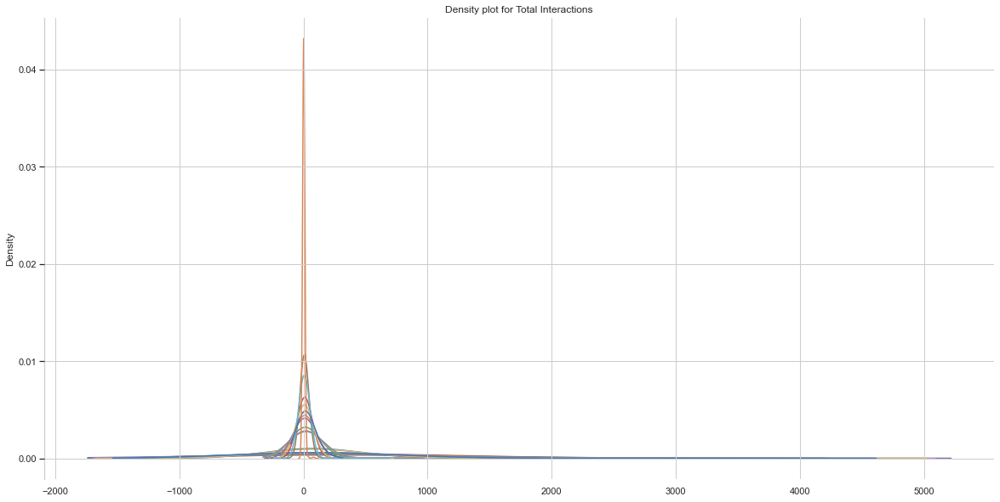

In [25]:
def zscore(x):
    mu = x.mean()
    std = x.std()

    return (x - mu)/std

total_interactions_column_ins = df5_ins_trimmed.loc[:,"Total Interactions"]
total_interactions_column_face = df5_face_trimmed.loc[:,"Total Interactions"]

# change from sereies to dataframe
total_interactions_column_df_ins = pd.DataFrame(total_interactions_column_ins)
total_interactions_column_df_face = pd.DataFrame(total_interactions_column_face)
zscore_total_interactions_ins = total_interactions_column_df_ins.apply(zscore)
zscore_total_interactions_face = total_interactions_column_df_face.apply(zscore)

def binary_zscore(x):
    if x > 3 or x < -3:
        return 0
    else:
        return 1

binary_zscore_total_interactions_ins = zscore_total_interactions_ins.applymap(binary_zscore)
binary_zscore_total_interactions_face = zscore_total_interactions_face.applymap(binary_zscore)
# rename column name to "binary_outlier" from "Total Interactions"
binary_zscore_total_interactions_ins.rename(columns = {'Total Interactions':'binary_outlier'}, inplace = True)
binary_zscore_total_interactions_face.rename(columns = {'Total Interactions':'binary_outlier'}, inplace = True)

# apped the binary_outlier column to the original dataframe
df5_ins_trimmed = pd.concat([df5_ins_trimmed, binary_zscore_total_interactions_ins], axis = 1)
df5_face_trimmed = pd.concat([df5_face_trimmed, binary_zscore_total_interactions_face], axis = 1)


# get rid of outliers in total interactions graph
for tag in tag_unique:
    df5_ins_trimmed[(df5_ins_trimmed[tag] == 1) & (df5_ins_trimmed['binary_outlier'] == 1)]['Total Interactions'].plot.density(bw_method = 1.75,figsize = (20,10))

for tag in tag_unique_face:
    df5_face_trimmed[(df5_face_trimmed[tag] == 1) & (df5_face_trimmed['binary_outlier'] == 1)]['Total Interactions'].plot.density(bw_method = 1.75,figsize = (20,10))

plt.title('Density plot for Total Interactions')
plt.show()

Text(0.5, 1.0, 'Density plot for Total Interactions of each hashtag (Instagram)')

Text(0.5, 0, 'Total Interactions')

Text(0, 0.5, 'Density')

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Instagram)'}, xlabel='Total Interactions', ylabel='Density'>

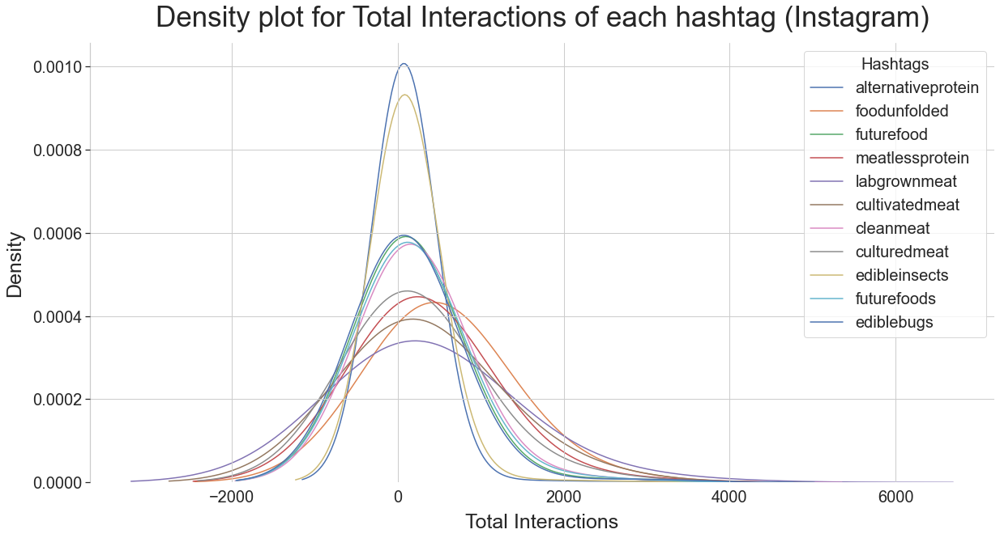

In [26]:
f, ax8 = plt.subplots(figsize=(20, 10))
sns.set_theme(style="whitegrid")
plt.title('Density plot for Total Interactions of each hashtag (Instagram)',fontsize= 35, pad=20)
plt.xlabel('Total Interactions',fontsize=25, labelpad= 10)
plt.ylabel('Density',fontsize=25, labelpad= 10)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
for tag in tag_unique:
    sns.kdeplot(data=df5_ins_trimmed[(df5_ins_trimmed[tag] == 1) & (df5_ins_trimmed['binary_outlier'] == 1)]['Total Interactions'],bw_method = 1.75, label=tag)
    plt.legend()

plt.legend(title = "Hashtags",fontsize = 20, title_fontsize = 20)


Text(0.5, 1.0, 'Density plot for Total Interactions of each hashtag (Facebook)')

Text(0.5, 0, 'Total Interactions')

Text(0, 0.5, 'Density')

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

<AxesSubplot:title={'center':'Density plot for Total Interactions of each hashtag (Facebook)'}, xlabel='Total Interactions', ylabel='Density'>

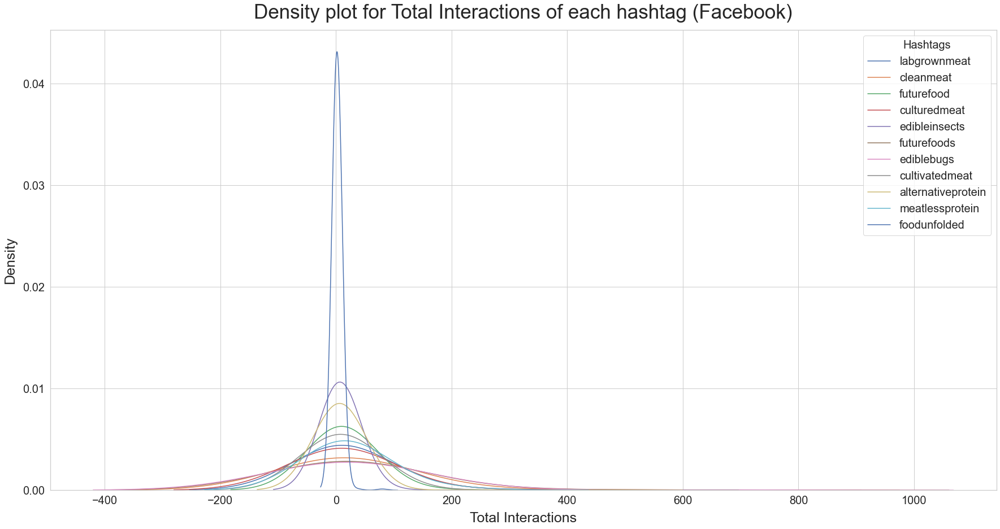

In [27]:
f, ax9 = plt.subplots(figsize=(30, 15))
sns.set_theme(style="whitegrid")
plt.title('Density plot for Total Interactions of each hashtag (Facebook)',fontsize= 35, pad=20)
plt.xlabel('Total Interactions',fontsize=25, labelpad= 10)
plt.ylabel('Density',fontsize=25, labelpad= 10)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
for tag in tag_unique_face:
    sns.kdeplot(data=df5_face_trimmed[(df5_face_trimmed[tag] == 1) & (df5_face_trimmed['binary_outlier'] == 1)]['Total Interactions'],bw_method = 1.75, label=tag)
    plt.legend()

plt.legend(title = "Hashtags",fontsize = 20, title_fontsize = 20)


<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

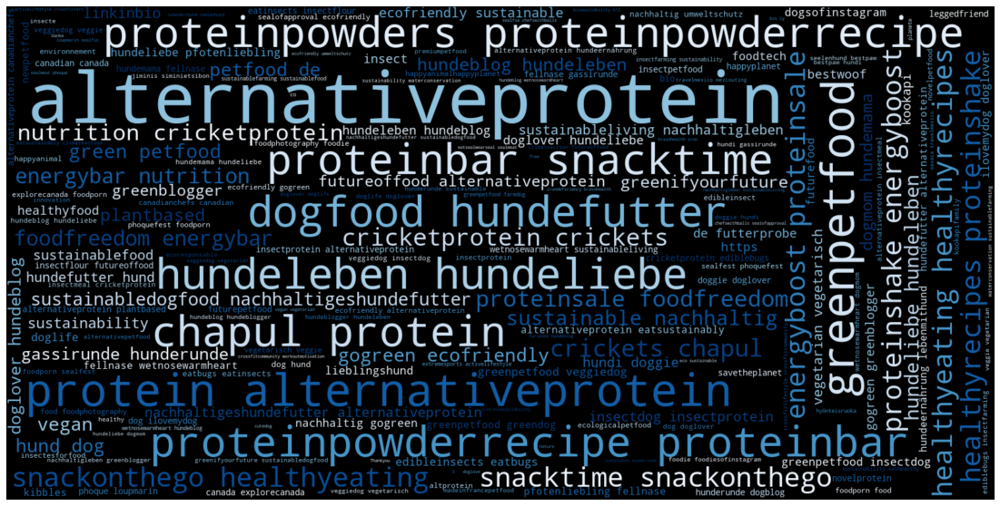

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

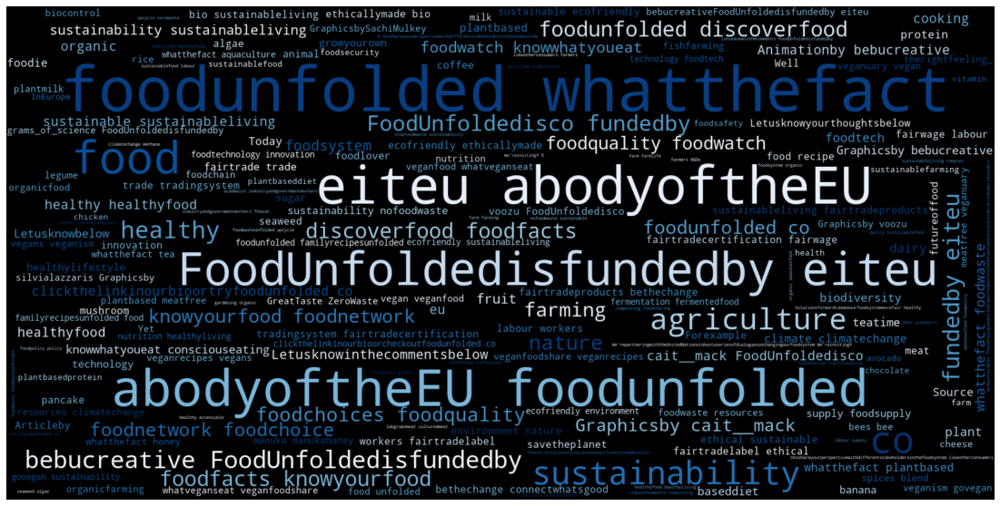

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

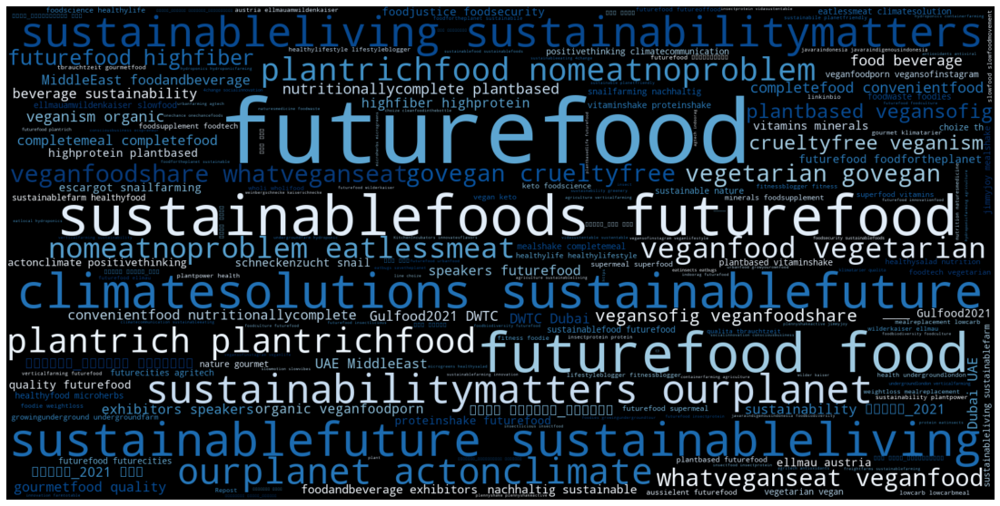

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

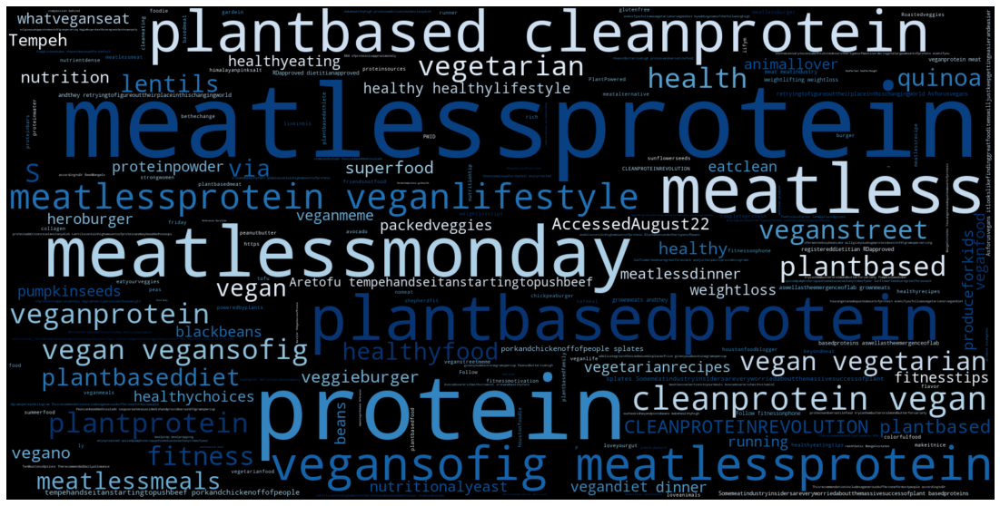

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

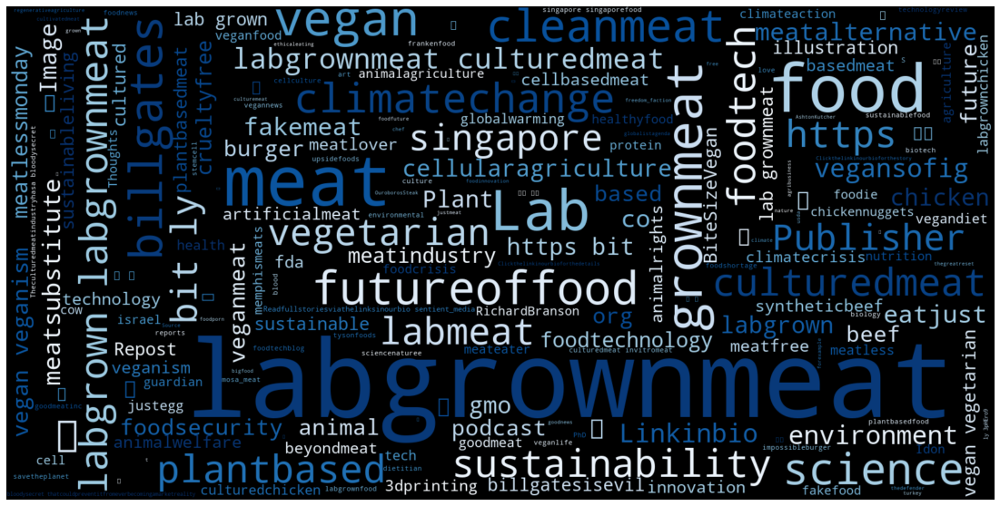

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

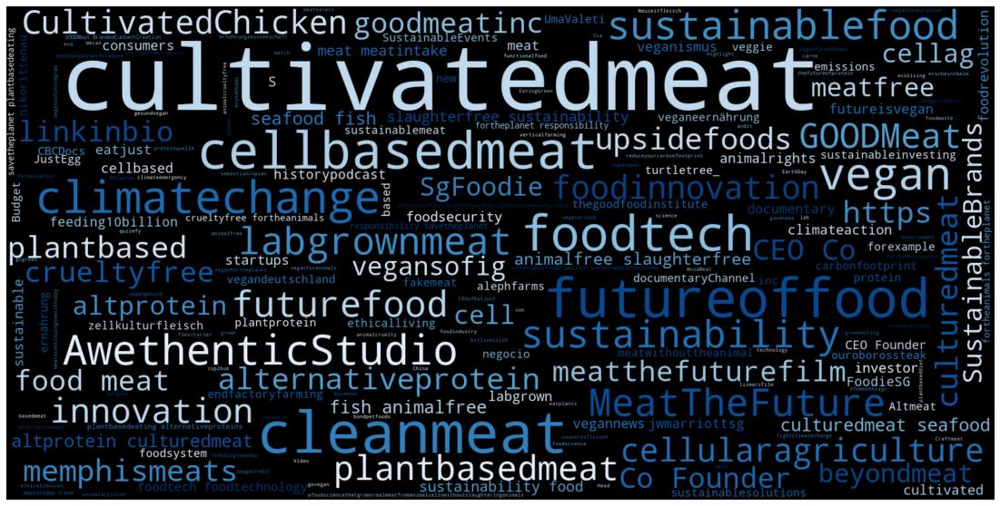

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

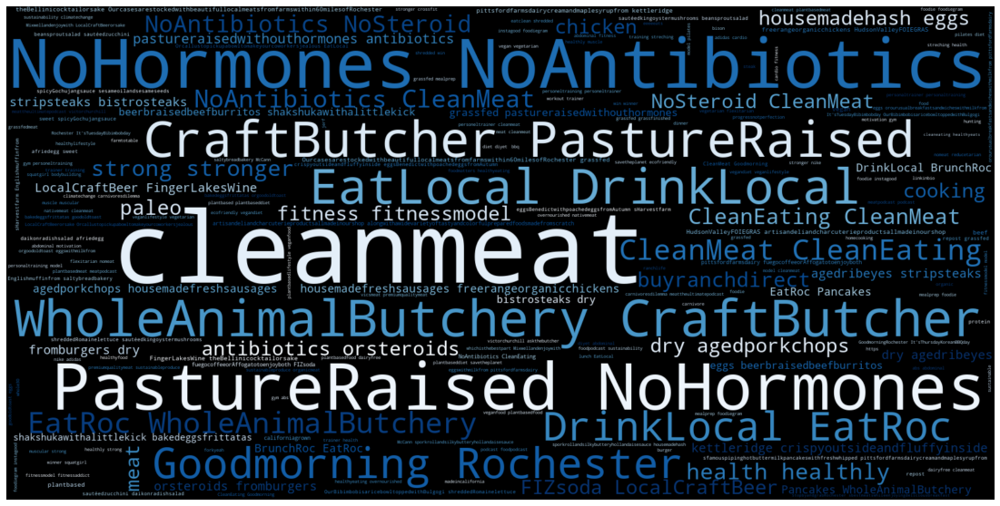

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

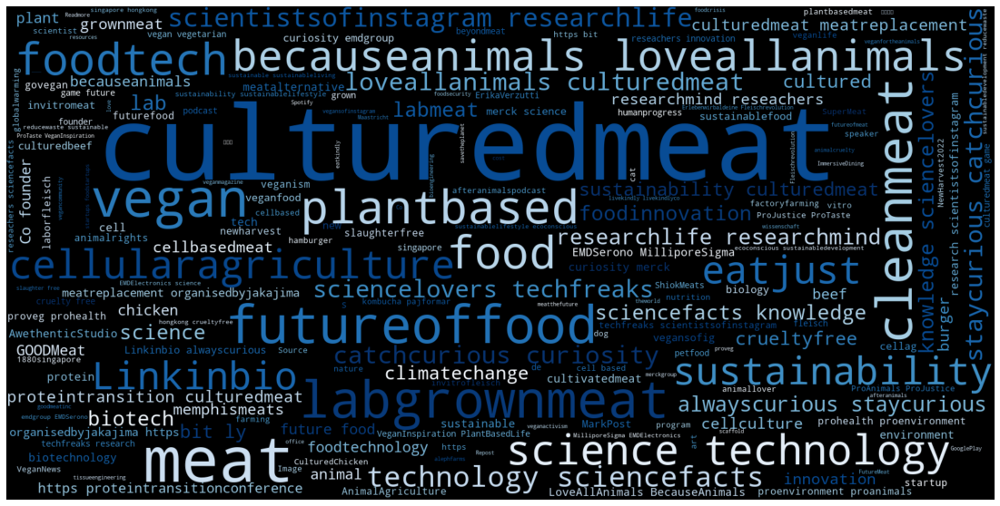

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

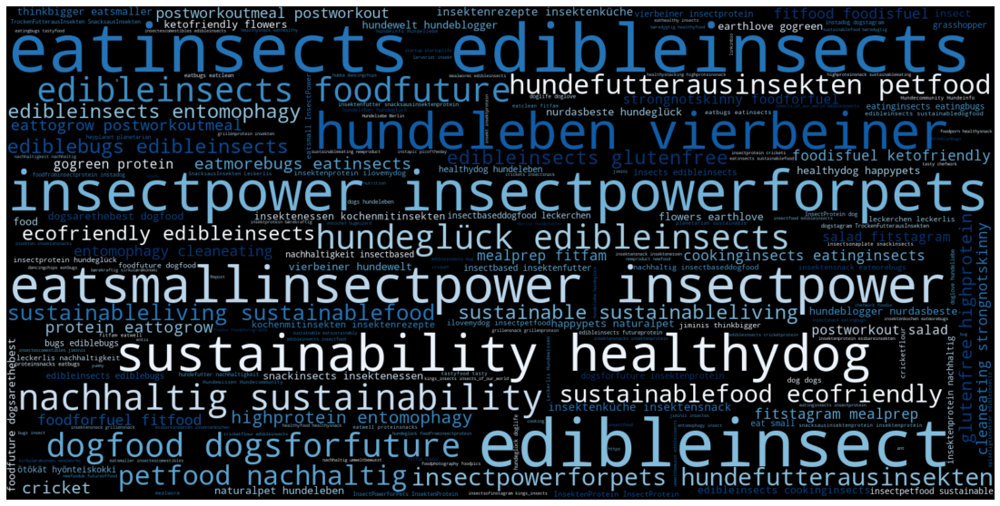

<Figure size 1440x720 with 0 Axes>

(-0.5, 1599.5, 799.5, -0.5)

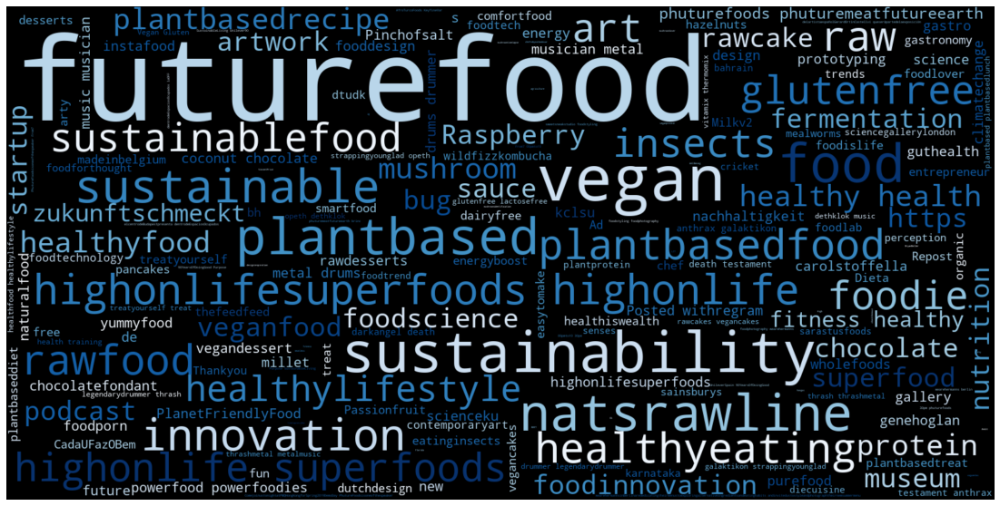

In [28]:
## word clouds of the descriptions for every hashtag (or the most used)
## Importing all packages
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt

## Using df5_trimmed as the base and creating a new datafram that includes only the Description column for faster data processing
Description_df_ins = df5_ins_trimmed[['Description','alternativeprotein', 'foodunfolded', 'futurefood',
       'meatlessprotein', 'labgrownmeat', 'cultivatedmeat', 'cleanmeat',
       'culturedmeat', 'edibleinsects', 'futurefoods', 'ediblebugs']]

## Creating a function that query the Description_df_ins and return a df that contains only the values of the specific hashtag
def df_specific(input_dataframe,input_tag):
       returned_df = input_dataframe[input_dataframe[input_tag]==1]['Description']
       return returned_df

## More Processing
al = df_specific(Description_df_ins, 'alternativeprotein')
d= {}
for tag in tag_unique:
       d[tag] = df_specific(Description_df_ins,tag)

all_list = []
for tag in d:
       all_list.append(' '.join(d[tag]))

## Using for loop to generate wordcloud for each hashtag
for i in range(10):
    text = all_list[i]
    # Create and generate a word cloud image:
    wordcloud = WordCloud(width=1600,height=800,colormap="Blues").generate(text)

    # Display the generated image:
    plt.figure( figsize = (20,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()


In [29]:
df5_ins_trimmed['id'] = df5_ins_trimmed.index
first_column = df5_ins_trimmed.pop('id')
df5_ins_trimmed.insert(0,'id', first_column)

df_ins_for_model = df5_ins_trimmed[['Description']]
series = df_ins_for_model['Description'].values.tolist()
series = [str(i) for i in series]

##new_list = []
##for i in series:
    ##if len(i) <= 514:
        ##new_list.append(i)   

In [42]:
df5_face_trimmed['id'] = df5_face_trimmed.index
first_column_face = df5_face_trimmed.pop('id')
df5_face_trimmed.insert(0,'id', first_column_face)

df_face_for_model = df5_face_trimmed[['Message']]
series_face = df_face_for_model['Message'].values.tolist()
series_face = [str(i) for i in series_face]

##new_list = []
##for i in series_face:
    ##if len(i) <= 514:
        ##new_list.append(i)   

In [41]:
## Generating Sentimental Scores
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
scores_list = []
for i in series:
    scores_list.append(analyzer.polarity_scores(i))
## turn the results into a dataframe

df_ins_scores_list = pd.DataFrame(scores_list)

print(df_ins_scores_list)

df_ins_sentiscore = pd.merge(df5_ins_trimmed, df_ins_scores_list, left_index= True, right_index = True)
df_ins_sentiscore.head()
df_ins_sentiscore.info()

         neg    neu    pos  compound
0      0.000  0.625  0.375    0.6369
1      0.000  1.000  0.000    0.0000
2      0.000  0.733  0.267    0.5080
3      0.196  0.804  0.000   -0.2960
4      0.000  1.000  0.000    0.0000
...      ...    ...    ...       ...
10162  0.000  0.656  0.344    0.6369
10163  0.000  1.000  0.000    0.0000
10164  0.000  1.000  0.000    0.0000
10165  0.000  1.000  0.000    0.0000
10166  0.000  1.000  0.000    0.0000

[10167 rows x 4 columns]


,id,Account,User Name,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Views,Like and View Counts Disabled,URL,Photo,Description,Image Text,Sponsor Id,Sponsor Name,Overperforming Score,HASHTAG,alternativeprotein,foodunfolded,futurefood,meatlessprotein,labgrownmeat,cultivatedmeat,cleanmeat,culturedmeat,edibleinsects,futurefoods,ediblebugs,binary_outlier,neg,neu,pos,compound
0,0,GeneliaDeshmukh,geneliad,7291844.0,2021-10-1605:22:21EDT,2021-10-16,05:22:21,Album,49779,49634,145,0,False,https://www.instagram.com/p/CVFZVlsogvO/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/246276386_246951120783485_3238136309611538599_n.jpg?_nc_cat=104&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=OnNeGx8TluQAX9UBzao&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9usnNIWXLUn-EHWuNd7z1LzLTyIMDnp3FRQv_TAmb1fg&oe=62E48BAF,"#worldfoodday2021\n\nWeneedtomakeourfood-ourinvestmentintoourhealth,ourbeingandalltheotherbeingsthatexistandmostimportantlyourplanet💚\n\nLet’schangeourplanet-Onebiteatatime..\n\nWww.imaginemeats.com\n\n•\n#ImagineMeats#ImagineChicken#ImagineMutton#Plantbased#Plantbasedmeat#Plantlover#Happymeat#Meatfree#Meatlesseveryday#alternativeprotein#Meatlessmeat#Crueltyfree#worldfoodday2021",NaN,NaN,NaN,-6.16,alternativeprotein,1,0,0,0,0,0,0,0,0,0,0,0,0.000,0.625,0.375,0.6369
1,1,TheNkitchen,blend.of.spices,NaN,2022-01-0511:13:43EST,2022-01-05,11:13:43,Album,46189,46025,164,0,False,https://www.instagram.com/p/CYWszc_PzsB/,https://scontent-sea1-1.cdninstagram.com/v/t51.29350-15/271304997_228085712837104_2842214994172471325_n.jpg?_nc_cat=106&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=qrjgj-0YJ64AX81LGaA&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT9ZaF0DwmVaaKX54JYylFWwTebxIRkUR3PJ9z5Bnyx8uw&oe=62E44E12,SwipelefttoChooseyourfavoritecholecombo➡️➡️\n.\n1.CholeBhature🍱🍱\n.\n2.CholeSamosa🧆🧆\n.\n3.CholeParatha🥙🥙\n.\n4.CholeKulcha🥘🥘\n.\n5.CholeChawal🍛🍛\n.\n6.CholeKachori🍲🍲\n.\n7.CholeNaan🌮🌮\n.\n8.CholeTikki🍝🍝\n.\n9.CholePoori🍜🍜\n\nCommentdownyourfavouritecomboandformoresuchupdatesfollow@blend.of.spices@blend.of.spices\n@blend.of.spices@blend.of.spices\n\n#choleplatter#cholecombo#cholebhature#cholechawal#cholepoori#kulcha#tikki#samose#kachori#naan#paratha#delhigram#delhieats#delhifood#foodiesofinstagram#foodcontest#foodcompetition#comment#foodgasm#foodblogger#indianfoodblogger#noidaeats#calcuttafoodie#punjabifood#amritsari#foodunfolded,NaN,NaN,NaN,0,foodunfolded,0,1,0,0,0,0,0,0,0,0,0,0,0.000,1.000,0.000,0.0000
2,2,MovingMountainsFoods,movingmountainsfoods,24100.0,2021-01-0805:00:06EST,2021-01-08,05:00:06,Photo,31126,30857,269,0,False,https://www.instagram.com/p/CJx6SQis_Qh/,NaN,"📣ANNOUNCEMENT📣\n\nWehavejustlaunchedthemeatiestplant-basedproductintheworld!Introducingourbrandnewplant-basedBeefTenderStrips🎉Nowavailablefrom@Sainsburys-findtheminthefrozenaisle!\n\nTolearnmoreaboutour#OutrageouslyMeatyproduct,tapthelinkinourbio.\n.\n.\n.\n#MovingMountains#meatmadefromplants#plantbasedbeef#vegancommunity#whatveganseat#vegannews#sustainablefood#veganchef#plantbased#futurefood#plantpower#healthyeating#plantbasedfood#veganbeef#veganmeat",NaN,NaN,NaN,80.22,futurefood,0,0,1,0,0,0,0,0,0,0,0,0,0.000,0.733,0.267,0.5080
3,3,www.melissas.com,melissasproduce,74828.0,2021-04-0921:35:07EDT,2021-04-09,21:35:07,Photo,20938,20855,83,0,False,https://www.instagram.com/p/CNd5nvNDUN4/,https://scontent-sea1-1.cdninstagram.com/v/t51.2885-15/170374983_913633265878490_2541226670276993394_n.jpg?_nc_cat=100&ccb=1-7&_nc_sid=8ae9d6&_nc_ohc=LHf1_n4afjUAX8MBg35&_nc_ht=scontent-sea1-1.cdninstagram.com&oh=00_AT_M0sFOGda7oRnBVI4cqnXPT3ASoTUVj3A1gqbm4HApUw&oe=62E5276B,Wereallylovethiseasyguideby@nutritional_factzwithplantbasedproteinalternativesifyou'relimitingornoteatinganimalprotein.Whichoneareyoumostsurprisedby?🤓\n•\n•\n•\n•\n•\n•\n#melissasproduce#melissas#produce#losangeles#melissasproducecompany#plantbased#plantprotein#protein#healthyeating#healthyrecipes#meatless#meatlessmonday#meatlessprotein#mealprep#mealprepping#health#healthy#healthylifes

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10167 entries, 0 to 10166
Data columns (total 37 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   id                             10167 non-null  int64  
 1   Account                        10154 non-null  object 
 2   User Name                      10167 non-null  object 
 3   Followers at Posting           4129 non-null   float64
 4   Post Created                   10167 non-null  object 
 5   Post Created Date              10167 non-null  object 
 6   Post Created Time              10167 non-null  object 
 7   Type                           10167 non-null  object 
 8   Total Interactions             10167 non-null  int64  
 9   Likes                          10167 non-null  int64  
 10  Comments                       10167 non-null  int64  
 11  Views                          10167 non-null  int64  
 12  Like and View Counts Disabled  10167 non-null 

In [44]:
## Generating Sentimental Scores for facebook dataset
analyzer_face = SentimentIntensityAnalyzer()
scores_list_face = []
for i in series_face:
    scores_list_face.append(analyzer_face.polarity_scores(i))
## turn the results into a dataframe

df_face_scores_list = pd.DataFrame(scores_list_face)

print(df_face_scores_list)

df_face_sentiscore = pd.merge(df5_face_trimmed, df_face_scores_list, left_index= True, right_index = True)
df_face_sentiscore.head()
df_face_sentiscore.info()

      neg  neu  pos  compound
0     0.0  1.0  0.0       0.0
1     0.0  1.0  0.0       0.0
2     0.0  1.0  0.0       0.0
3     0.0  1.0  0.0       0.0
4     0.0  1.0  0.0       0.0
...   ...  ...  ...       ...
8622  0.0  1.0  0.0       0.0
8623  0.0  1.0  0.0       0.0
8624  0.0  1.0  0.0       0.0
8625  0.0  1.0  0.0       0.0
8626  0.0  1.0  0.0       0.0

[8627 rows x 4 columns]


,id,Page Name,User Name,Facebook Id,Page Category,Page Admin Top Country,Page Description,Page Created,Likes at Posting,Followers at Posting,Post Created,Post Created Date,Post Created Time,Type,Total Interactions,Likes,Comments,Shares,Love,Wow,Haha,Sad,Angry,Care,Video Share Status,Is Video Owner?,Post Views,Total Views,Total Views For All Crossposts,Video Length,URL,Message,Link,Final Link,Image Text,Link Text,Description,Sponsor Id,Sponsor Name,Sponsor Category,Overperforming Score,HASHTAG,labgrownmeat,cleanmeat,futurefood,culturedmeat,edibleinsects,futurefoods,ediblebugs,cultivatedmeat,alternativeprotein,meatlessprotein,foodunfolded,binary_outlier,neg,neu,pos,compound
0,0,EndTimeHeadlines,endtimeheadline,100044353509856,PERSONAL_BLOG,US,NewsandHeadlinesfroma“PropheticPerspective”,2010-07-0115:23:48,559945.0,548028.0,2020-05-1017:52:18PDT,2020-05-10,17:52:18,Link,11645,290,654,8455,4,416,9,140,1676,1,NaN,-,0,0,0,NaN,https://www.facebook.com/135010313189665/posts/3334488166575181,TysonFoodsisboostingitsbetonmeatthatcomesfromthelabinsteadoftheslaughterhouseandispartneringwithBillGatesandRichardBransonamongotherhighprofilebackers!#labgrownmeat#foodshortage#billgates#tysonfoods,https://endtimeheadlines.org/2020/05/tyson-foods-joins-bill-gates-and-cargill-to-invest-in-lab-meat-producer/,https://endtimeheadlines.org/,NaN,"TysonFoodsJoinsBillGatesandCargilltoInvestin""Lab-MeatProducer""","(ETH)-WithallthetalkaboutcomingfoodshortagesinAmericaandaroundtheworld,Itappearsthatthereisfutureinvestmentsbeingmadein",NaN,NaN,NaN,23.62,labgrownmeat,1,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0
1,1,Brinc,Brinc.io,824410874258605,INTERNET_COMPANY,HK,"HeadquarteredinHongKong,Brincisaleaderinglobalventureacceleration,operating18multidisciplinaryacceleratorprogramsin7countries.Brincacceleratesstartupsfocusedonsustainability.",2014-08-2609:27:10,2720.0,2905.0,2019-04-2718:28:59PDT,2019-04-27,18:28:59,Photo,10001,9986,0,1,12,1,1,0,0,0,NaN,-,0,0,0,NaN,https://www.facebook.com/824410874258605/posts/2476020049097671,"RecentlyincollaborationwithTheGoodFoodInstitute,wearedelightedtoreleasethefirstinternationaleditionofTheGoodFoodStartupManual.Themanualisa100+pagestep-by-stepinstructionbookforentrepreneurswhowanttosetuptheirownplant-basedorcell-basedproteinstartups🌱Readmore&download:https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e#GoodFoodInstitute:=:https://blog.brinc.io/brinc-good-food-institute-launch-a-food-startup-manual-99347ad7f01e#GFI#FoodTechnology#FoodTech#Startup#CleanMeat#CulturedMeat#PlantBased#FutureFood#FoodLab#SustainableFood#Sustainability#MeatAlternatives#Vegan",https://www.facebook.com/Brinc.io/photos/a.944565612243130/2476018862431123/?type=3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,526.37,"cleanmeat,futurefood,culturedmeat",0,1,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0
2,2,LegendKillerCharters,legendkillercharters,831781093546602,TOPIC_SPORTS_RECREATION,US,SaginawBayWalleye\nDetroitRiverWalleye\nSaginawRiverWalleye\nLakeMichiganKingSalmon\nOfferingfunfilledfishingtripsforthewholefamily.Weprideourselvesforbeingafunandeducationalfishingcharter.Tripsforallanglers!\n,2015-01-0800:51:45,NaN,NaN,2019-04-0818:01:02PDT,2019-04-08,18:01:02,NativeVideo,5869,819,411,4566,34,32,2,1,3,1,owned,Yes,33772,432773,0,00:01:10,https://www.facebook.com/831781093546602/posts/2294269170631113,"Filletingawalleyeplus,cheeksandwalleyewings!#walleye#saginawbay#walleyecharter#detroitriver#jigemup#motorcity#cleanmeat",https://www.facebook.com/legendkillercharters/videos/285843252312741/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.43,cleanmeat,0,1,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0
3,3,FoodStandardsAgency,FoodStandardsAgency,100064659582632,GOVERNMENT_ORGANIZATION,GB,We'retheFoodStandardsAgency.It’sourjobtouseourexpertiseandinfluencesothatpeopleca,2012-10-1114:49:48,44118.0,50267.0,2022-07-1304:20:03PDT,2022-07-13,04:20:03,Photo,5223,72,1217,3144,5,42,193,16,534,0,NaN,-,0,0,0,NaN,https://www.facebook.com/100064659582632/posts/406233634875286,"Todaywehavelaunc

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8627 entries, 0 to 8626
Data columns (total 58 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              8627 non-null   int64  
 1   Page Name                       8627 non-null   object 
 2   User Name                       7798 non-null   object 
 3   Facebook Id                     8627 non-null   int64  
 4   Page Category                   8615 non-null   object 
 5   Page Admin Top Country          5711 non-null   object 
 6   Page Description                7839 non-null   object 
 7   Page Created                    7839 non-null   object 
 8   Likes at Posting                4579 non-null   float64
 9   Followers at Posting            3468 non-null   float64
 10  Post Created                    8627 non-null   object 
 11  Post Created Date               8627 non-null   object 
 12  Post Created Time               86

In [31]:
neg_list =[]
neu_list = []
pos_list = []
for tag in tag_unique:
    neg_list.append(df_ins_sentiscore.groupby(tag)['neg'].mean().filter(items=[1]))
    neu_list.append(df_ins_sentiscore.groupby(tag)['neu'].mean().filter(items=[1]))
    pos_list.append(df_ins_sentiscore.groupby(tag)['pos'].mean().filter(items=[1]))

df_ins_sentiscore_average = pd.DataFrame({"Negative" : neg_list, "Neutual" : neu_list, "Positive": pos_list}, index = tag_unique.tolist())
df_ins_sentiscore_average.reset_index(inplace=True)
df_ins_sentiscore_average= df_ins_sentiscore_average.rename(columns={'index':'Hashtags'})

df_melt = pd.melt(df_ins_sentiscore_average, id_vars=['Hashtags'], value_vars=['Negative', 'Neutual', 'Positive'],var_name = "Sentiment", value_name = "Average")
df_melt['Average'] = df_melt['Average'].astype(float)
df_melt.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Hashtags   33 non-null     object 
 1   Sentiment  33 non-null     object 
 2   Average    33 non-null     float64
dtypes: float64(1), object(2)
memory usage: 920.0+ bytes


In [45]:
neg_list_face =[]
neu_list_face = []
pos_list_face = []
for tag in tag_unique_face:
    neg_list_face.append(df_face_sentiscore.groupby(tag)['neg'].mean().filter(items=[1]))
    neu_list_face.append(df_face_sentiscore.groupby(tag)['neu'].mean().filter(items=[1]))
    pos_list_face.append(df_face_sentiscore.groupby(tag)['pos'].mean().filter(items=[1]))

df_face_sentiscore_average = pd.DataFrame({"Negative" : neg_list_face, "Neutual" : neu_list_face, "Positive": pos_list_face}, index = tag_unique_face.tolist())
df_face_sentiscore_average.reset_index(inplace=True)
df_face_sentiscore_average= df_face_sentiscore_average.rename(columns={'index':'Hashtags'})

df_melt_face = pd.melt(df_face_sentiscore_average, id_vars=['Hashtags'], value_vars=['Negative', 'Neutual', 'Positive'],var_name = "Sentiment", value_name = "Average")
df_melt_face['Average'] = df_melt_face['Average'].astype(float)
df_melt_face.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Hashtags   33 non-null     object 
 1   Sentiment  33 non-null     object 
 2   Average    33 non-null     float64
dtypes: float64(1), object(2)
memory usage: 920.0+ bytes


<AxesSubplot:xlabel='Hashtags', ylabel='Average'>

Text(0.5, 1.0, 'Average Sentimental Scores for each hashtag (Instagram)')

Text(0.5, 0, 'Hashtags')

Text(0, 0.5, 'Average Sentimental Scores')

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'alternativeprotein'),
  Text(1, 0, 'foodunfolded'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'meatlessprotein'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'cultivatedmeat'),
  Text(6, 0, 'cleanmeat'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'edibleinsects'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'alternativeprotein'),
  Text(1, 0, 'foodunfolded'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'meatlessprotein'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'cultivatedmeat'),
  Text(6, 0, 'cleanmeat'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'edibleinsects'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

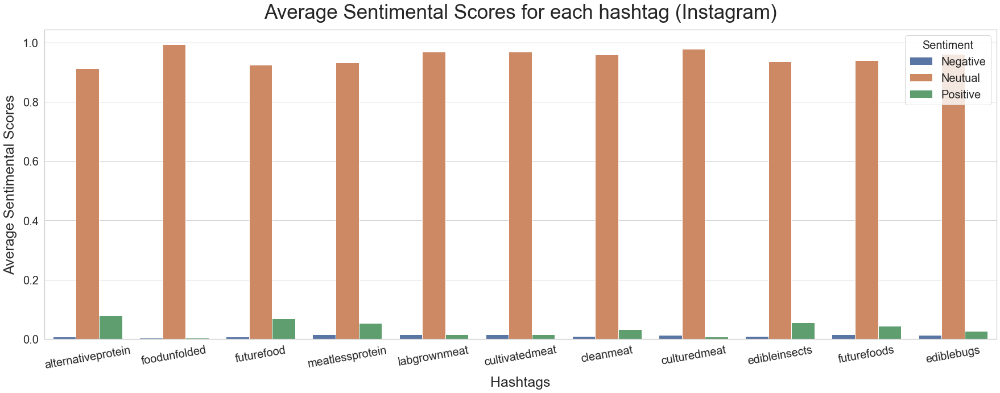

In [32]:
f, ax10 = plt.subplots(figsize=(30, 10))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hashtags", y="Average", hue="Sentiment", data=df_melt)
plt.title('Average Sentimental Scores for each hashtag (Instagram)',fontsize= 35, pad=20)
plt.xlabel('Hashtags',fontsize=25, labelpad= 10)
plt.ylabel('Average Sentimental Scores',fontsize=25, labelpad= 10)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.xticks(rotation=10)
plt.legend(title='Sentiment',fontsize=20, title_fontsize=20, loc ="upper right")


<AxesSubplot:xlabel='Hashtags', ylabel='Average'>

Text(0.5, 1.0, 'Average Sentimental Scores for each hashtag (Facebook)')

Text(0.5, 0, 'Hashtags')

Text(0, 0.5, 'Average Sentimental Scores')

(array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'labgrownmeat'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'culturedmeat'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'futurefoods'),
  Text(6, 0, 'ediblebugs'),
  Text(7, 0, 'cultivatedmeat'),
  Text(8, 0, 'alternativeprotein'),
  Text(9, 0, 'meatlessprotein'),
  Text(10, 0, 'foodunfolded')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'labgrownmeat'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'culturedmeat'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'futurefoods'),
  Text(6, 0, 'ediblebugs'),
  Text(7, 0, 'cultivatedmeat'),
  Text(8, 0, 'alternativeprotein'),
  Text(9, 0, 'meatlessprotein'),
  Text(10, 0, 'foodunfolded')])

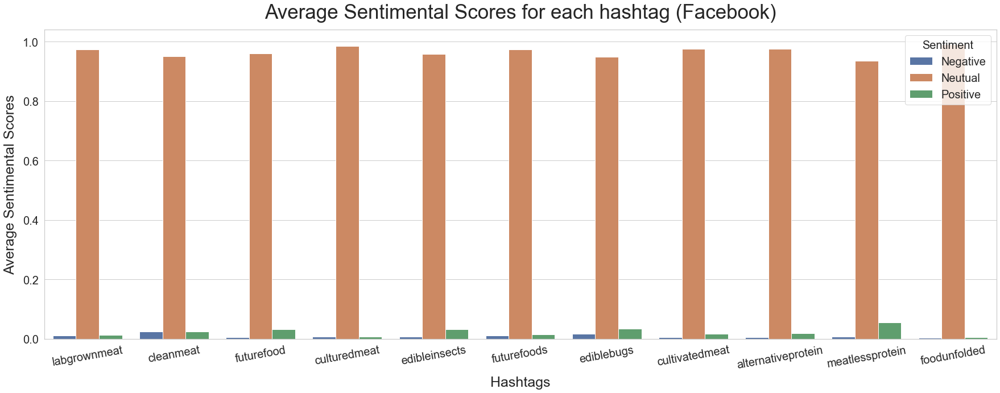

In [46]:
f, ax11 = plt.subplots(figsize=(30, 10))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hashtags", y="Average", hue="Sentiment", data=df_melt_face)
plt.title('Average Sentimental Scores for each hashtag (Facebook)',fontsize= 35, pad=20)
plt.xlabel('Hashtags',fontsize=25, labelpad= 10)
plt.ylabel('Average Sentimental Scores',fontsize=25, labelpad= 10)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.xticks(rotation=10)
plt.legend(title='Sentiment',fontsize=20, title_fontsize=20, loc ="upper right")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Hashtags   22 non-null     object 
 1   Sentiment  22 non-null     object 
 2   Average    22 non-null     float64
dtypes: float64(1), object(2)
memory usage: 656.0+ bytes


<AxesSubplot:xlabel='Hashtags', ylabel='Average'>

Text(0.5, 1.0, 'Average Sentimental Scores for each hashtag (Instagram)')

Text(0.5, 0, 'Hashtags')

Text(0, 0.5, 'Average Sentimental Scores')

(array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'alternativeprotein'),
  Text(1, 0, 'foodunfolded'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'meatlessprotein'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'cultivatedmeat'),
  Text(6, 0, 'cleanmeat'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'edibleinsects'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'alternativeprotein'),
  Text(1, 0, 'foodunfolded'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'meatlessprotein'),
  Text(4, 0, 'labgrownmeat'),
  Text(5, 0, 'cultivatedmeat'),
  Text(6, 0, 'cleanmeat'),
  Text(7, 0, 'culturedmeat'),
  Text(8, 0, 'edibleinsects'),
  Text(9, 0, 'futurefoods'),
  Text(10, 0, 'ediblebugs')])

Text(-0.2, 0.009315447154471544, '0.01')

Text(0.8, 0.004116531165311653, '0.0')

Text(1.8, 0.008236330772706732, '0.01')

Text(2.8, 0.015984375000000002, '0.01')

Text(3.8, 0.015971014492753625, '0.01')

Text(4.8, 0.01676086956521739, '0.02')

Text(5.8, 0.011020667726550078, '0.01')

Text(6.8, 0.015053231939163497, '0.01')

Text(7.8, 0.010509523809523809, '0.01')

Text(8.8, 0.016762162162162163, '0.02')

Text(9.8, 0.013637426900584795, '0.01')

Text(0.2, 0.07915121951219513, '0.08')

Text(1.2, 0.005021680216802168, '0.0')

Text(2.2, 0.07019724356077722, '0.07')

Text(3.2, 0.0536875, '0.05')

Text(4.2, 0.01718840579710145, '0.02')

Text(5.2, 0.016478260869565216, '0.02')

Text(6.2, 0.03308903020667727, '0.03')

Text(7.2, 0.008536121673003803, '0.01')

Text(8.2, 0.05587099567099567, '0.05')

Text(9.2, 0.04477297297297297, '0.04')

Text(10.2, 0.027222222222222224, '0.03')

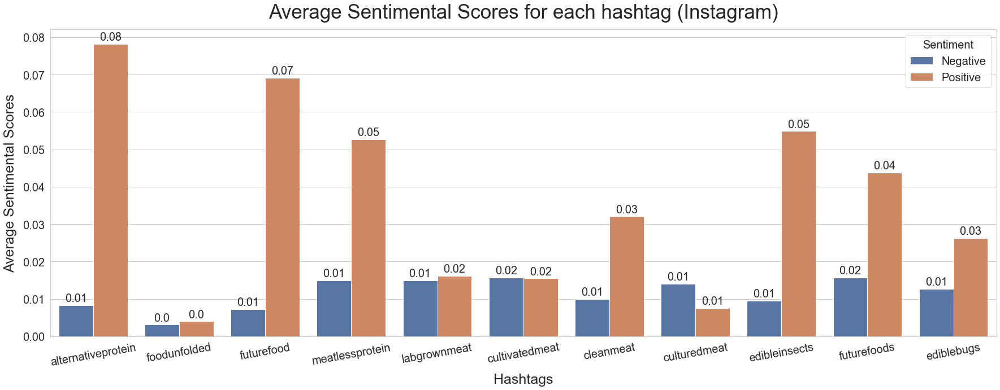

In [33]:
## Creating the same dataframe as above but removing neutral column since average neutral scores across hashtags are all close to 1
neg_list =[]
pos_list = []
for tag in tag_unique:
    neg_list.append(df_ins_sentiscore.groupby(tag)['neg'].mean().filter(items=[1]))
    pos_list.append(df_ins_sentiscore.groupby(tag)['pos'].mean().filter(items=[1]))

df_ins_sentiscore_average_v2 = pd.DataFrame({"Negative" : neg_list, "Positive": pos_list}, index = tag_unique.tolist())
df_ins_sentiscore_average_v2.reset_index(inplace=True)
df_ins_sentiscore_average_v2= df_ins_sentiscore_average_v2.rename(columns={'index':'Hashtags'})

df_melt_withoutNeg = pd.melt(df_ins_sentiscore_average_v2, id_vars=['Hashtags'], value_vars=['Negative', 'Positive'],var_name = "Sentiment", value_name = "Average")
df_melt_withoutNeg['Average'] = df_melt_withoutNeg['Average'].astype(float)
df_melt_withoutNeg.info()

## Plotting the barplot using the dataframe above

f, ax11 = plt.subplots(figsize=(30, 10))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hashtags", y="Average", hue="Sentiment", data=df_melt_withoutNeg)
plt.title('Average Sentimental Scores for each hashtag (Instagram)',fontsize= 35, pad=20)
plt.xlabel('Hashtags',fontsize=25, labelpad= 10)
plt.ylabel('Average Sentimental Scores',fontsize=25, labelpad= 10)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.xticks(rotation=10)
plt.legend(title='Sentiment',fontsize=20, title_fontsize=20, loc ="upper right")


## Putting labels of count and percentage on top of each bar in the graph
patches_df_melt_Neg = ax11.patches
for i in range(len(patches_df_melt_Neg)):
   x1 = patches_df_melt_Neg[i].get_x() + patches_df_melt_Neg[i].get_width()/2
   y1 = patches_df_melt_Neg[i].get_height() + 0.001

   ax11.annotate('{:}'.format(df_melt_withoutNeg['Average'][i].round(2)), (x1, y1), ha='center',fontsize= 20)
plt.show()




<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22 entries, 0 to 21
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Hashtags   22 non-null     object 
 1   Sentiment  22 non-null     object 
 2   Average    22 non-null     float64
dtypes: float64(1), object(2)
memory usage: 656.0+ bytes


<AxesSubplot:xlabel='Hashtags', ylabel='Average'>

Text(0.5, 1.0, 'Average Sentimental Scores for each hashtag (Facebook)')

Text(0.5, 0, 'Hashtags')

Text(0, 0.5, 'Average Sentimental Scores')

(array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'labgrownmeat'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'culturedmeat'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'futurefoods'),
  Text(6, 0, 'ediblebugs'),
  Text(7, 0, 'cultivatedmeat'),
  Text(8, 0, 'alternativeprotein'),
  Text(9, 0, 'meatlessprotein'),
  Text(10, 0, 'foodunfolded')])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'labgrownmeat'),
  Text(1, 0, 'cleanmeat'),
  Text(2, 0, 'futurefood'),
  Text(3, 0, 'culturedmeat'),
  Text(4, 0, 'edibleinsects'),
  Text(5, 0, 'futurefoods'),
  Text(6, 0, 'ediblebugs'),
  Text(7, 0, 'cultivatedmeat'),
  Text(8, 0, 'alternativeprotein'),
  Text(9, 0, 'meatlessprotein'),
  Text(10, 0, 'foodunfolded')])

Text(-0.2, 0.012012345679012347, '0.01')

Text(0.8, 0.025561843168957155, '0.02')

Text(1.8, 0.006872716558632881, '0.01')

Text(2.8, 0.008075208913649025, '0.01')

Text(3.8, 0.00927829150154117, '0.01')

Text(4.8, 0.01155421686746988, '0.01')

Text(5.8, 0.018000000000000002, '0.02')

Text(6.8, 0.007354430379746835, '0.01')

Text(7.8, 0.006102564102564103, '0.01')

Text(8.8, 0.0084, '0.01')

Text(9.8, 0.005124324324324325, '0.0')

Text(0.2, 0.015012345679012346, '0.01')

Text(1.2, 0.025788197251414714, '0.02')

Text(2.2, 0.03386800235710077, '0.03')

Text(3.2, 0.009200557103064066, '0.01')

Text(4.2, 0.033641567591369444, '0.03')

Text(5.2, 0.016367469879518072, '0.02')

Text(6.2, 0.03491780821917808, '0.03')

Text(7.2, 0.01811392405063291, '0.02')

Text(8.2, 0.020596153846153847, '0.02')

Text(9.2, 0.057075, '0.06')

Text(10.2, 0.006013513513513514, '0.01')

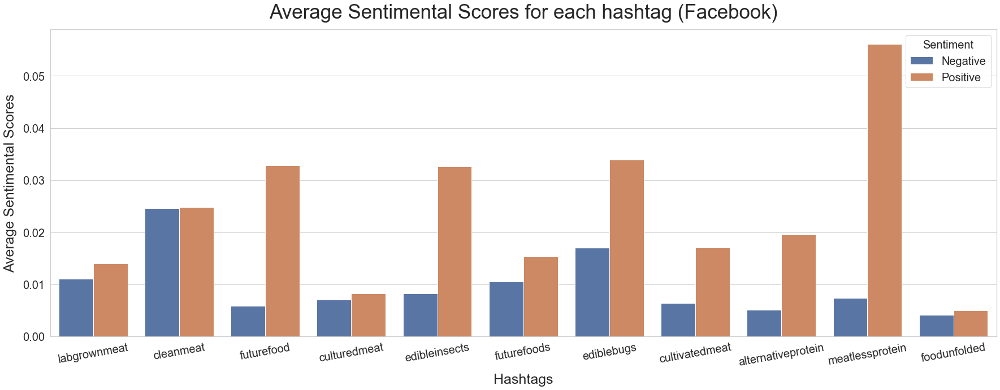

In [47]:
## Creating the same dataframe as above but removing neutral column since average neutral scores across hashtags are all close to 1
neg_list_face =[]
pos_list_face = []
for tag in tag_unique_face:
    neg_list_face.append(df_face_sentiscore.groupby(tag)['neg'].mean().filter(items=[1]))
    pos_list_face.append(df_face_sentiscore.groupby(tag)['pos'].mean().filter(items=[1]))

df_face_sentiscore_average_v2 = pd.DataFrame({"Negative" : neg_list_face, "Positive": pos_list_face}, index = tag_unique_face.tolist())
df_face_sentiscore_average_v2.reset_index(inplace=True)
df_face_sentiscore_average_v2= df_face_sentiscore_average_v2.rename(columns={'index':'Hashtags'})

df_melt_withoutNeg_face = pd.melt(df_face_sentiscore_average_v2, id_vars=['Hashtags'], value_vars=['Negative', 'Positive'],var_name = "Sentiment", value_name = "Average")
df_melt_withoutNeg_face['Average'] = df_melt_withoutNeg_face['Average'].astype(float)
df_melt_withoutNeg_face.info()

## Plotting the barplot using the dataframe above

f, ax12 = plt.subplots(figsize=(30, 10))
sns.set_theme(style="whitegrid")
sns.barplot(x="Hashtags", y="Average", hue="Sentiment", data=df_melt_withoutNeg_face)
plt.title('Average Sentimental Scores for each hashtag (Facebook)',fontsize= 35, pad=20)
plt.xlabel('Hashtags',fontsize=25, labelpad= 10)
plt.ylabel('Average Sentimental Scores',fontsize=25, labelpad= 10)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.xticks(rotation=10)
plt.legend(title='Sentiment',fontsize=20, title_fontsize=20, loc ="upper right")


## Putting labels of count and percentage on top of each bar in the graph
patches_df_melt_Neg_face = ax12.patches
for i in range(len(patches_df_melt_Neg_face)):
   x1 = patches_df_melt_Neg_face[i].get_x() + patches_df_melt_Neg_face[i].get_width()/2
   y1 = patches_df_melt_Neg_face[i].get_height() + 0.001

   ax11.annotate('{:}'.format(df_melt_withoutNeg_face['Average'][i].round(2)), (x1, y1), ha='center',fontsize= 20)
plt.show()




alternativeprotein


Text(0.5, 0.98, 'alternativeprotein')

foodunfolded


Text(0.5, 0.98, 'foodunfolded')

futurefood


Text(0.5, 0.98, 'futurefood')

meatlessprotein


Text(0.5, 0.98, 'meatlessprotein')

labgrownmeat


Text(0.5, 0.98, 'labgrownmeat')

cultivatedmeat


Text(0.5, 0.98, 'cultivatedmeat')

cleanmeat


Text(0.5, 0.98, 'cleanmeat')

culturedmeat


Text(0.5, 0.98, 'culturedmeat')

edibleinsects


Text(0.5, 0.98, 'edibleinsects')

futurefoods


Text(0.5, 0.98, 'futurefoods')

ediblebugs


Text(0.5, 0.98, 'ediblebugs')

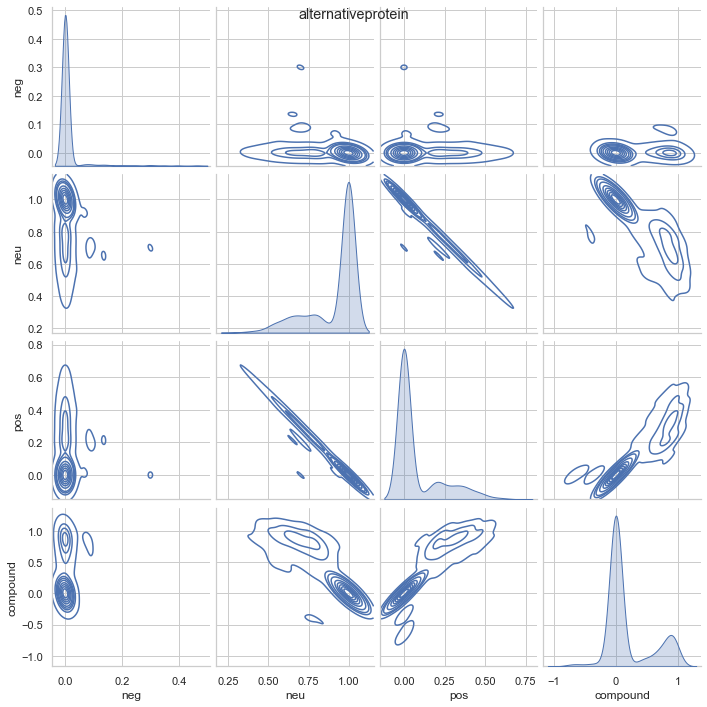

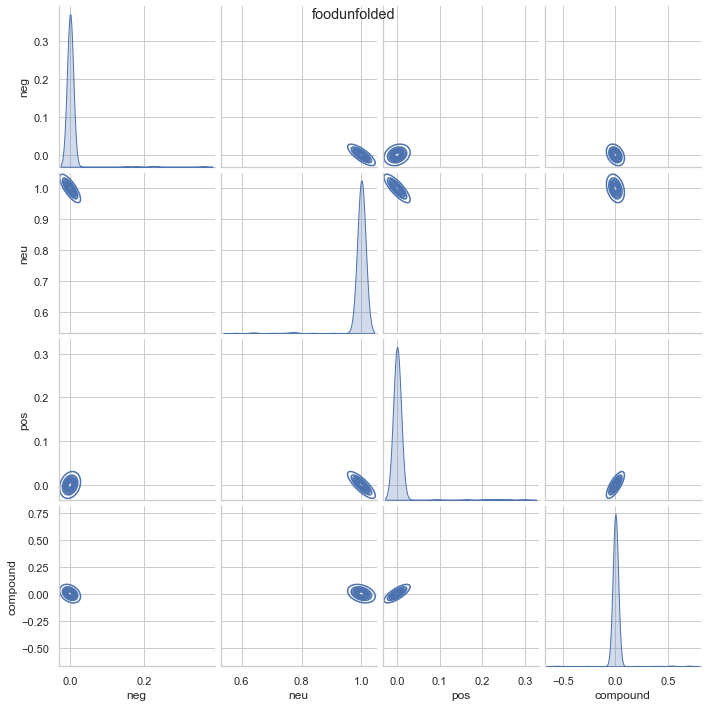

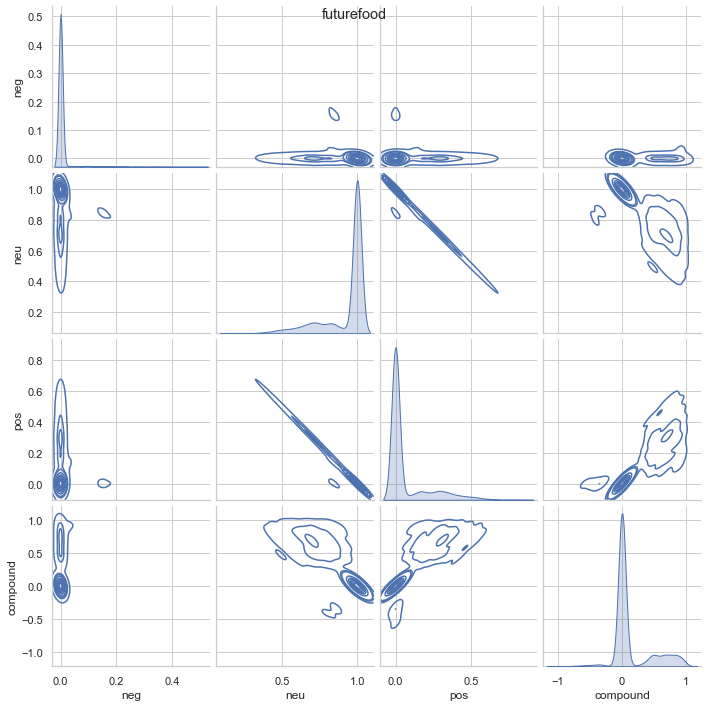

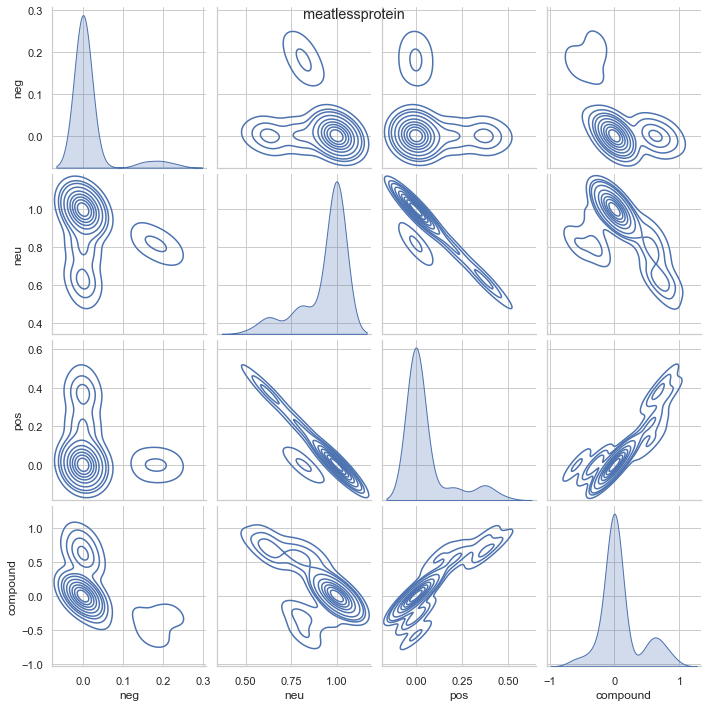

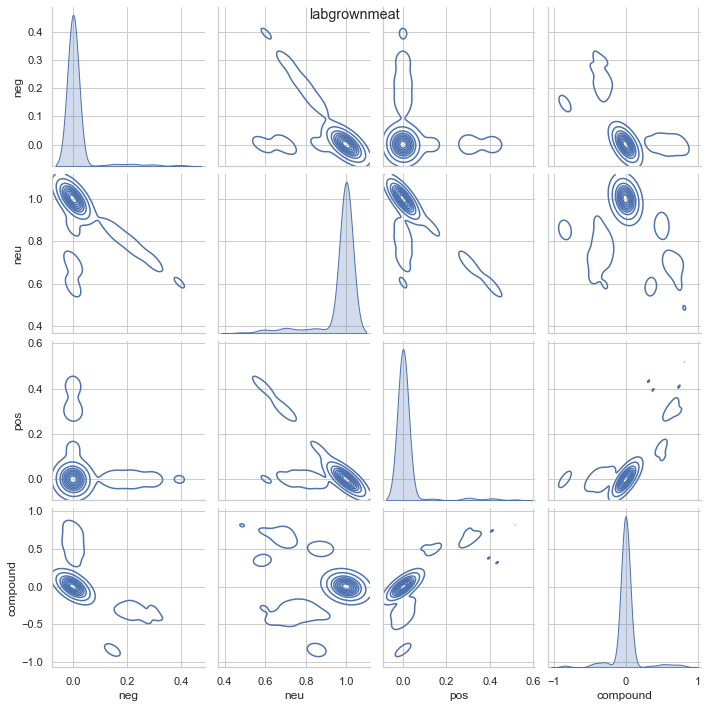

...

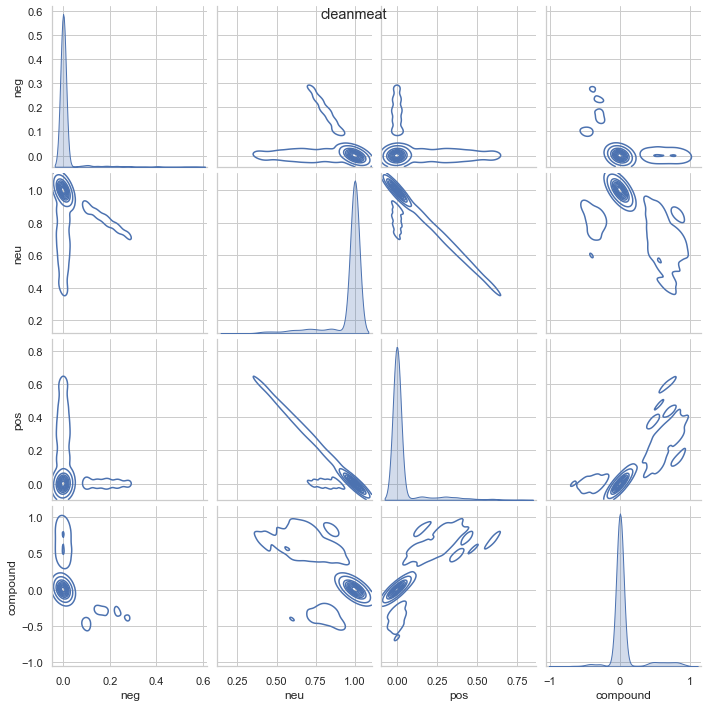

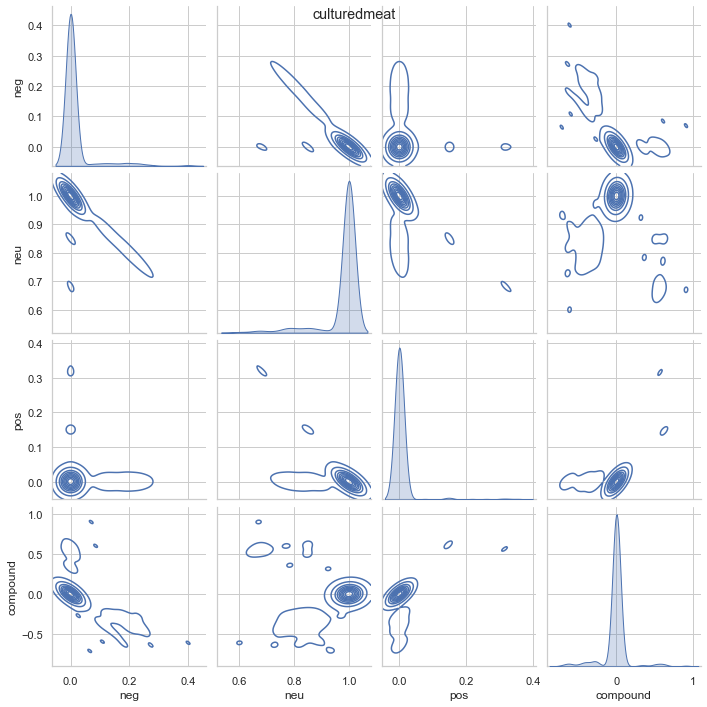

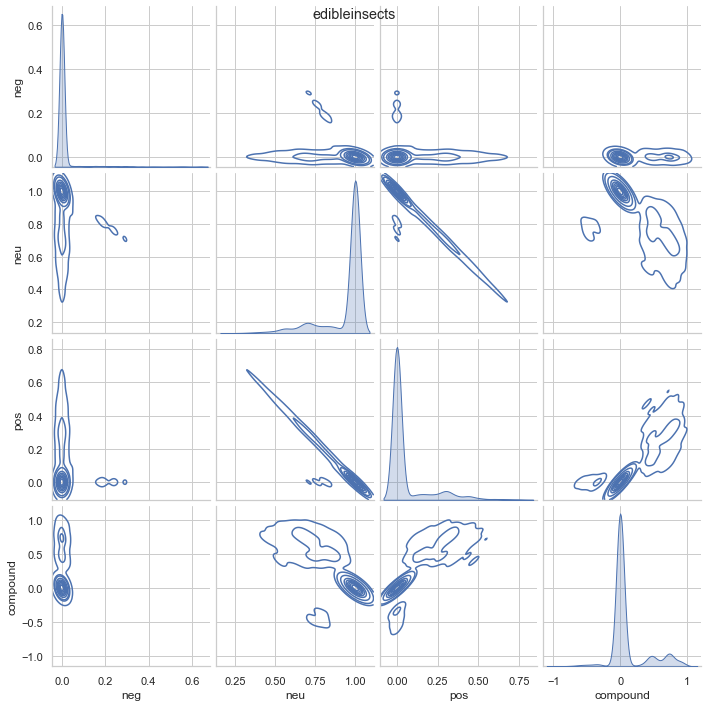

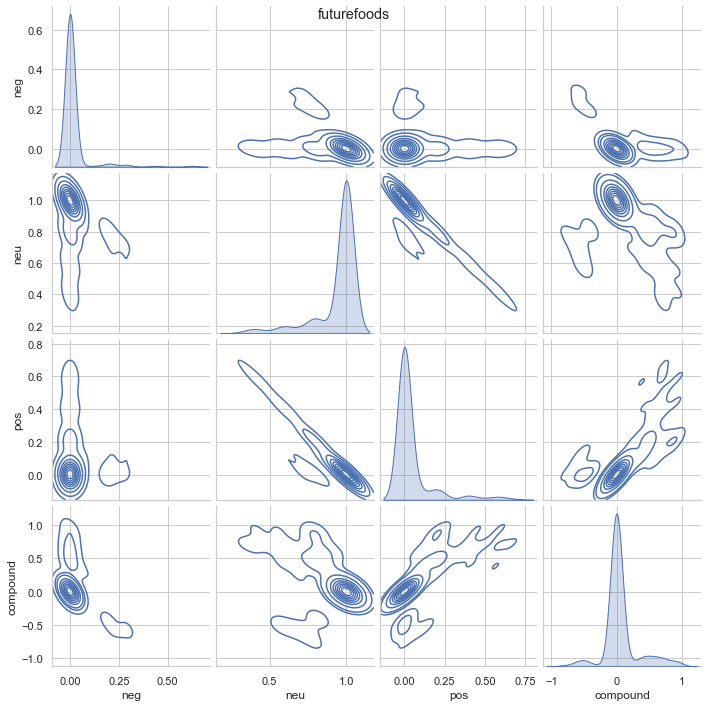

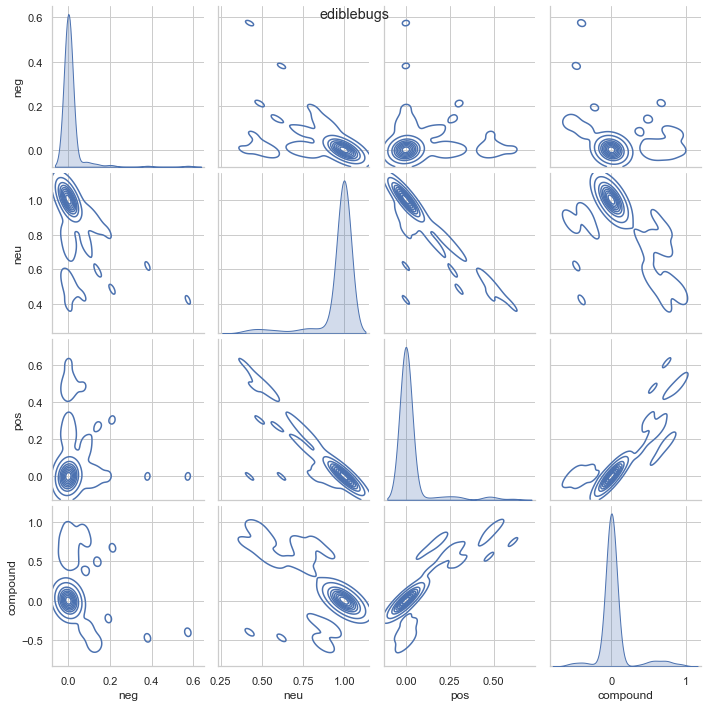

In [34]:
## Querying each hashtag to create new dataframe

for tag in tag_unique:
    for x,y in df_ins_sentiscore.iteritems():
        if tag == x:
            print(tag)
            speci_df_senti_score = df_ins_sentiscore[df_ins_sentiscore[tag] == 1]
            
            g = sns.pairplot(speci_df_senti_score, x_vars=['neg','neu','pos','compound'], y_vars=['neg','neu','pos','compound'],kind="kde")
            g.fig.suptitle(tag)
            ##graph = sns.PairGrid(speci_df_senti_score, x_vars=['neg','neu','pos','compound'], y_vars=['neg','neu','pos','compound'])
            ##graph.map_upper(sns.histplot)
            ##graph.map_lower(sns.kdeplot, fill = True)
            ##graph.map_diag(sns.histplot, kde =True)


